# Data


In [1]:
import os
import pandas as pd
import json
import numpy as np

# Load the data
ciq_data = pd.read_excel('../Files/BDO_uploads/CIQ_data_DS_LAB.xlsx')
# Drop rows where 'Name' is 'xyz' or 'testtt'
ciq_data = ciq_data[~ciq_data['Name'].isin(['Nordea Bank Abp', 'Dassault Aviation SA', '1 - 600 of 600'])]
# Converting 'Board Member' entries in 'bm2' to NaN
ciq_data['bm2'] = ciq_data['bm2'].replace('Board Member', np.nan)
# Columns to lowercase
#cols_lower = [col for col in ciq_data if col not in ['IQ_EMPLOYEES']]
cols_lower = [col for col in ciq_data]
# Lowercase all columns except for employees
ciq_data[cols_lower] = ciq_data[cols_lower].apply(lambda x: x.astype(str).str.lower(),axis=1)

# Describe the data, before converting columns to strings
ciq_data.describe()

# Select only the relevant columns
attribute_columns = ciq_data.columns[1:]  # Exclude 'Name' column

# Dataframe to Dictionary Conversion
# Only the values are stored in lists, excluding the column headers and excluding NaN values.
dictionary = (ciq_data.set_index('Name')[attribute_columns]
                    .apply(lambda x: [i for i in x.dropna().astype(str) if i.lower() != 'nan'], axis=1)
                    .to_dict())

# JSON Conversion and File Writing
json_str = json.dumps(dictionary, ensure_ascii=True, indent=4)  # Pretty print the JSON

# Writing to a JSON file
with open('CIQ_data.json', 'w', encoding="utf8") as f:
    f.write(json_str)

# Libraries


In [2]:
# Libraries
#%load_ext cudf.pandas
#import os
#import pandas as pd
#import json
#import numpy as np
from collections import Counter
import networkx as nx
import networkx.algorithms.community
#import cugraph as cnx
import gravis as gv
import matplotlib.pyplot as plt
import community as community_louvain
from sklearn.linear_model import LinearRegression


# Network file processing


In [2]:
# Process the network files to extract relationships based on shared attributes.
def process_network_file(filename):
    with open(filename, 'r') as file:
        data = json.load(file)

    source_target_pairs = []
    
    companies = list(data.keys())
    # Iterate over each unique pair of companies to find common attributes
    for i in range(len(companies)):
        source = companies[i]
        for j in range(i+1, len(companies)):
            target = companies[j]
            common_attributes = set(data[source]).intersection(set(data[target]))
            source_attributes = ", ".join(data[source])
            target_attributes = ", ".join(data[target])
            if common_attributes:
                # Sort source and target for consistent ordering
                sorted_source_target = tuple(sorted([source, target]))
                common_attributes_str = ", ".join(common_attributes)
                # The weight of the relationship is determined by the number of shared attributes
                weight = len(common_attributes)
                source_target_pairs.append((sorted_source_target[0], sorted_source_target[1], source_attributes, target_attributes, common_attributes_str, weight))

    df = pd.DataFrame(source_target_pairs, columns=['Source', 'Target', 'Source Attributes',
                                                    'Target Attributes', 'Common Attributes', 'Weight'])
    # Drop duplicates based on Source and Target columns
    df.drop_duplicates(subset=['Source', 'Target'], inplace=True)
    
    attribute_counts = {}  # Dictionary to count occurrences of each attribute

    for company, attributes in data.items():
        for attribute in attributes:
            attribute_counts[attribute] = attribute_counts.get(attribute, 0) + 1

    # Sorting the attributes by their occurrence
    sorted_attributes = sorted(attribute_counts.items(), key=lambda x: x[1], reverse=True)
    return df, sorted_attributes

# Load and process network data

network_2011_path = "../Files/BDO_uploads/network_2011_update_28112023.txt"
network_2013_path = "../Files/BDO_uploads/network_2013_update_28112023.txt"
network_2016_path = "../Files/BDO_uploads/network_2016_update_28112023.txt"
#network_2023_ciq_path = "files/CIQ_data.json"
network_2022_path = "../Files/BDO_uploads/network_2022_update_28112023.txt"

network_2011_df, network_2011_attributes = process_network_file(network_2011_path)
network_2013_df, network_2013_attributes = process_network_file(network_2013_path)
network_2016_df, network_2016_attributes = process_network_file(network_2016_path)
#network_2023_df = process_network_file(network_2023_ciq_path)
network_2022_df, network_2022_attributes = process_network_file(network_2022_path)

# Data Validation: Identify companies without any relationships
isolated_nodes_2011 = set(network_2011_df['Source']) - set(network_2011_df['Target'])
isolated_nodes_2013 = set(network_2013_df['Source']) - set(network_2013_df['Target'])
isolated_nodes_2016 = set(network_2016_df['Source']) - set(network_2016_df['Target'])
#isolated_nodes_2023 = set(network_2023_df['Source']) - set(network_2023_df['Target'])
isolated_nodes_2022 = set(network_2022_df['Source']) - set(network_2022_df['Target'])

network_2011_df.head(), network_2013_df.head(), network_2016_df.head(), network_2022_df.head(), isolated_nodes_2011, isolated_nodes_2013, isolated_nodes_2016, isolated_nodes_2022


(                             Source                            Target  \
 0               erste group bank ag  raiffeisen bank international ag   
 1                        andritz ag  raiffeisen bank international ag   
 2                            omv ag  raiffeisen bank international ag   
 3  raiffeisen bank international ag                   wienerberger ag   
 4  raiffeisen bank international ag                    voestalpine ag   
 
                                    Source Attributes  \
 0  fi raiffeisen factoring ltd, network corporate...   
 1  fi raiffeisen factoring ltd, network corporate...   
 2  fi raiffeisen factoring ltd, network corporate...   
 3  fi raiffeisen factoring ltd, network corporate...   
 4  fi raiffeisen factoring ltd, network corporate...   
 
                                    Target Attributes  \
 0  stephanie offner, customer deposits associates...   
 1  elring klinger ag, andritz group, chinhunan ti...   
 2  nae aggm, gfk ag, ring oil holding 

## Alternative memory and speed optimised processing

However not used in practice as the improvements were negligible with our files.

In [ ]:
def process_network_file_optimized(filename):
    with open(filename, 'r') as file:
        data = json.load(file)

    # Use generators to create source-target pairs to minimize memory usage
    def generate_source_target_pairs(data):
        for source in data:
            for target in data:
                if source < target:  # Ensure we only deal with one order of pair (source, target)
                    common_attributes = set(data[source]).intersection(data[target])
                    if common_attributes:
                        yield (
                            source,
                            target,
                            ", ".join(data[source]),
                            ", ".join(data[target]),
                            ", ".join(common_attributes),
                            len(common_attributes)
                        )
    
    # Using a generator expression to avoid holding all pairs in memory
    source_target_pairs = generate_source_target_pairs(data)

    # Construct a DataFrame from the generator
    df = pd.DataFrame(source_target_pairs, columns=[
        'Source', 'Target', 'Source Attributes',
        'Target Attributes', 'Common Attributes', 'Weight'
    ])

    # Drop duplicates based on Source and Target columns
    df = df.drop_duplicates(subset=['Source', 'Target'])

    # Efficiently count attributes using Counter from the collections module
    attribute_counts = Counter(attribute for attributes in data.values() for attribute in attributes)

    # Sort attributes by their occurrence
    sorted_attributes = sorted(attribute_counts.items(), key=lambda x: x[1], reverse=True)

    return df, sorted_attributes

# Load and process network data
#network_2011_path = "files/network_2011_update_28112023.txt"
#network_2013_path = "files/network_2013_update_28112023.txt"
#network_2016_path = "files/network_2016_update_28112023.txt"
#network_2022_path = "files/network_2022_update_28112023.txt"

#network_2011_df, network_2011_attributes = process_network_file_optimized(network_2011_path)
#network_2013_df, network_2013_attributes = process_network_file_optimized(network_2013_path)
#network_2016_df, network_2016_attributes = process_network_file_optimized(network_2016_path)
#network_2022_df, network_2022_attributes = process_network_file_optimized(network_2022_path)

# Data Validation: Identify companies without any relationships
#isolated_nodes_2011 = set(network_2011_df['Source']) - set(network_2011_df['Target'])
#isolated_nodes_2013 = set(network_2013_df['Source']) - set(network_2013_df['Target'])
#isolated_nodes_2016 = set(network_2016_df['Source']) - set(network_2016_df['Target'])
#isolated_nodes_2022 = set(network_2022_df['Source']) - set(network_2022_df['Target'])

#network_2011_df.head(), network_2013_df.head(), network_2016_df.head(), network_2022_df.head(), isolated_nodes_2011, isolated_nodes_2013, isolated_nodes_2016, isolated_nodes_2022


In [33]:
len(network_2011_attributes), len(network_2013_attributes), len(network_2016_attributes), len(network_2022_attributes)


(127481, 139034, 146971, 234510)

In [4]:
# Display the most common attributes
network_2011_attributes[:100]


[('uk', 363),
 ('germany', 359),
 ('france', 354),
 ('us', 354),
 ('spain', 317),
 ('european union', 317),
 ('united kingdom', 316),
 ('china', 310),
 ('usa', 301),
 ('switzerland', 291),
 ('india', 280),
 ('brazil', 266),
 ('japan', 265),
 ('australia', 262),
 ('united states', 261),
 ('russia', 258),
 ('canada', 258),
 ('belgium', 255),
 ('poland', 248),
 ('singapore', 230),
 ('financial instruments', 228),
 ('portugal', 218),
 ('austria', 216),
 ('hong kong', 203),
 ('paris', 201),
 ('luxembourg', 198),
 ('mexico', 193),
 ('greece', 191),
 ('turkey', 189),
 ('norway', 188),
 ('denmark', 185),
 ('hungary', 170),
 ('finland', 167),
 ('shanghai', 165),
 ('england', 158),
 ('argentina', 156),
 ('malaysia', 154),
 ('czech republic', 153),
 ('european commission', 152),
 ('romania', 148),
 ('thailand', 143),
 ('indonesia', 142),
 ('business combinations', 138),
 ('slovakia', 138),
 ('human resources', 133),
 ('frankfurt', 132),
 ('new zealand', 130),
 ('investor relations', 126),
 ('taiw

In [5]:
# Display the most common attributes
network_2013_attributes[:100]


[('uk', 361),
 ('us', 358),
 ('germany', 357),
 ('france', 345),
 ('european union', 331),
 ('united kingdom', 313),
 ('china', 305),
 ('spain', 297),
 ('usa', 288),
 ('switzerland', 277),
 ('canada', 268),
 ('india', 263),
 ('united states', 261),
 ('japan', 258),
 ('australia', 252),
 ('brazil', 252),
 ('belgium', 241),
 ('russia', 239),
 ('poland', 225),
 ('singapore', 223),
 ('hong kong', 218),
 ('austria', 214),
 ('joint ventures', 205),
 ('paris', 203),
 ('turkey', 195),
 ('mexico', 194),
 ('luxembourg', 192),
 ('norway', 188),
 ('portugal', 186),
 ('denmark', 183),
 ('corporate governance', 182),
 ('european commission', 177),
 ('annual report', 175),
 ('finland', 174),
 ('england', 163),
 ('malaysia', 158),
 ('shanghai', 158),
 ('greece', 157),
 ('czech republic', 148),
 ('financial instruments', 144),
 ('hungary', 144),
 ('human resources', 143),
 ('indonesia', 142),
 ('argentina', 138),
 ('slovakia', 135),
 ('romania', 132),
 ('london stock exchange', 131),
 ('new zealand', 1

In [6]:
# Display the most common attributes
network_2016_attributes[:100]


[('uk', 368),
 ('us', 366),
 ('european union', 345),
 ('germany', 343),
 ('france', 338),
 ('united kingdom', 331),
 ('china', 314),
 ('usa', 293),
 ('spain', 290),
 ('canada', 279),
 ('switzerland', 271),
 ('australia', 265),
 ('india', 264),
 ('united states', 261),
 ('japan', 252),
 ('brazil', 252),
 ('singapore', 244),
 ('financial instruments', 241),
 ('belgium', 239),
 ('russia', 237),
 ('poland', 233),
 ('hong kong', 224),
 ('paris', 221),
 ('austria', 219),
 ('luxembourg', 212),
 ('mexico', 206),
 ('turkey', 196),
 ('denmark', 190),
 ('norway', 188),
 ('portugal', 184),
 ('england', 174),
 ('finland', 168),
 ('hungary', 165),
 ('malaysia', 164),
 ('european commission', 157),
 ('indonesia', 157),
 ('shanghai', 156),
 ('investor relations', 153),
 ('argentina', 152),
 ('human resources', 150),
 ('thailand', 148),
 ('greece', 143),
 ('romania', 141),
 ('blackrock inc', 141),
 ('london stock exchange', 137),
 ('uk corporate governance code', 130),
 ('new zealand', 129),
 ('wales'

In [7]:
# Display the most common attributes
network_2022_attributes[:100]


[('ukraine', 574),
 ('us', 535),
 ('uk', 522),
 ('germany', 509),
 ('russia', 503),
 ('france', 488),
 ('china', 481),
 ('united kingdom', 472),
 ('spain', 437),
 ('united states', 426),
 ('european union', 425),
 ('switzerland', 407),
 ('canada', 404),
 ('usa', 404),
 ('india', 390),
 ('australia', 389),
 ('poland', 372),
 ('paris', 368),
 ('singapore', 364),
 ('belgium', 353),
 ('brazil', 347),
 ('japan', 345),
 ('financial disclosures', 334),
 ('hong kong', 312),
 ('austria', 302),
 ('european commission', 294),
 ('denmark', 285),
 ('norway', 277),
 ('mexico', 277),
 ('luxembourg', 269),
 ('investor relations', 256),
 ('un global compact', 256),
 ('united nations', 254),
 ('portugal', 253),
 ('shanghai', 243),
 ('malaysia', 242),
 ('turkey', 239),
 ('finland', 238),
 ('england', 233),
 ('romania', 224),
 ('human resources', 223),
 ('hungary', 222),
 ('indonesia', 222),
 ('blackrock inc', 219),
 ('thailand', 217),
 ('un sustainable development goals', 209),
 ('taiwan', 209),
 ('europ

# Merge CIQ attributes to processed network df


In [8]:
# Define the attributes to merge from CIQ data
selected_attributes = ["IQ_PRIMARY_INDUSTRY", "IQ_EXCHANGE"] # country and city no longer included, as they are already in the updated networks

def merge_ciq_network(ciq_data, network_df, selected_attributes):
    # Merging based on the 'Source' column in network data
    merged_df_source = pd.merge(network_df, ciq_data[selected_attributes + ['Name']], 
                                left_on='Source', right_on='Name', how='left')
    for attr in selected_attributes:
        merged_df_source['Source Attributes'] = merged_df_source['Source Attributes'] + ', ' + merged_df_source[attr].astype(str)
    merged_df_source.drop(['Name'] + selected_attributes, axis=1, inplace=True)
    
    # Merging based on the 'Target' column in network data
    merged_df_target = pd.merge(merged_df_source, ciq_data[selected_attributes + ['Name']], 
                                left_on='Target', right_on='Name', how='left', suffixes=('_source', '_target'))
    for attr in selected_attributes:
        merged_df_target['Target Attributes'] = merged_df_target['Target Attributes'] + ', ' + merged_df_target[attr].astype(str)
    merged_df_target.drop(['Name'] + selected_attributes, axis=1, inplace=True)
    
    # Updating Common Attributes
    merged_df_target['Common Attributes'] = merged_df_target.apply(lambda row: ', '.join(set(row['Source Attributes'].split(', ')).intersection(set(row['Target Attributes'].split(', ')))), axis=1)
    
    # Updating Weights since there might be new Common Attributes
    #merged_df_target['Weight'] = merged_df_target['Common Attributes'].apply(lambda x: len(x))
    merged_df_target['Weight'] = merged_df_target['Common Attributes'].apply(lambda x: len(x.split(', ')))
    
    return merged_df_target

# Merging CIQ data with network data for each year using the updated function
network_2011_merged_lowercase = merge_ciq_network(ciq_data, network_2011_df, selected_attributes)
network_2013_merged_lowercase = merge_ciq_network(ciq_data, network_2013_df, selected_attributes)
network_2016_merged_lowercase = merge_ciq_network(ciq_data, network_2016_df, selected_attributes)
network_2022_merged_lowercase = merge_ciq_network(ciq_data, network_2022_df, selected_attributes)

# Displaying the merged data
network_2011_merged_lowercase.head(), network_2013_merged_lowercase.head(), network_2016_merged_lowercase.head(), network_2022_merged_lowercase.head()


(                             Source                            Target  \
 0               erste group bank ag  raiffeisen bank international ag   
 1                        andritz ag  raiffeisen bank international ag   
 2                            omv ag  raiffeisen bank international ag   
 3  raiffeisen bank international ag                   wienerberger ag   
 4  raiffeisen bank international ag                    voestalpine ag   
 
                                    Source Attributes  \
 0  fi raiffeisen factoring ltd, network corporate...   
 1  fi raiffeisen factoring ltd, network corporate...   
 2  fi raiffeisen factoring ltd, network corporate...   
 3  fi raiffeisen factoring ltd, network corporate...   
 4  fi raiffeisen factoring ltd, network corporate...   
 
                                    Target Attributes  \
 0  stephanie offner, customer deposits associates...   
 1  elring klinger ag, andritz group, chinhunan ti...   
 2  nae aggm, gfk ag, ring oil holding 

In [ ]:
#network_2011_df.to_pickle('network_2011_df.p')
#network_2013_df.to_pickle('network_2013_df.p')
#network_2016_df.to_pickle('network_2016_df.p')
#network_2022_df.to_pickle('network_2022_df.p')

#network_2011_df = pd.read_pickle('network_2011_df.p')
#network_2013_df = pd.read_pickle('network_2013_df.p')
#network_2016_df = pd.read_pickle('network_2016_df.p')
#network_2022_df = pd.read_pickle('network_2022_df.p')

#network_2011_merged_lowercase.to_pickle('network_2011_merged_lowercase.p')
#network_2013_merged_lowercase.to_pickle('network_2013_merged_lowercase.p')
#network_2016_merged_lowercase.to_pickle('network_2016_merged_lowercase.p')
#network_2022_merged_lowercase.to_pickle('network_2022_merged_lowercase.p')


In [9]:
network_2011_df.sort_values(by=['Weight'], ascending=False)


,Source,Target,Source Attributes,Target Attributes,Common Attributes,Weight
26936,deutsche post ag,siemens ag,"exel secretarial services limited, realty corp...","building technologies, medical systems spa, wh...","corporate finance, america, doha, new zealand,...",153
33675,porsche automobil holding se,volkswagen ag,"business development man, man vermietungs gmbh...","sellschaft mbh co kg, volks wagen ag, tionally...","familie porsche beteiligung gmbh, doha, din is...",142
32962,siemens ag,thyssenkrupp ag,"building technologies, medical systems spa, wh...","manama, thyssenkrupp vdm benelux bv, thyssenkr...","america, doha, new zealand, prague, budapest, ...",136
26937,deutsche post ag,thyssenkrupp ag,"exel secretarial services limited, realty corp...","manama, thyssenkrupp vdm benelux bv, thyssenkr...","america, doha, new zealand, bangalore, prague,...",132
26942,allianz se,deutsche post ag,"exel secretarial services limited, realty corp...","protexifrance sa, travel and assistance, impri...","new zealand, prague, budapest, milan, france, ...",130
...,...,...,...,...,...,...
82647,castellum ab,greggs plc,"greggs employment benefit trust, british food ...","mölnlycke healthcare ab, nestor st, ljungarum ...",financial instruments,1
74218,persimmon plc,ses sa,"emerging mediltd, somerset charles church, sto...","commissariat aux assurances, euronext paris, s...",united kingdom,1
26375,cts eventim ag & co kgaa,st james's place plc,"america, klaus-peter schulenberg, bernd kundru...","analysis of movement in, etree electronic comm...",us,1
26376,cts eventim ag & co kgaa,sse plc,"america, klaus-peter schulenberg, bernd kundru...","or energy and utility services, supply sse, ia...",germany,1


In [10]:
network_2013_df.sort_values(by=['Weight'], ascending=False)


,Source,Target,Source Attributes,Target Attributes,Common Attributes,Weight
67753,bae systems plc,boeing,"aircraft carrier alliance, british aerospace a...","ned non, carnival triumph, aircraft carrier al...","rosyth, state for business innovation and skil...",278
16919,swiss life holding ag,swiss re ag,"operating mcev, swiss life funds, financial so...","operating mcev, swiss life funds, talanx ag, ...","nav fs rc cev, deutschland holding gmbh, capit...",274
87858,cnh industrial nv,exor nv,"iveco czech republic as vysoke, harbin, food e...","harbin, holdings systems, shahriar tadjbakhsh,...","iveco finance limited, cnh australipty limited...",271
32809,porsche automobil holding se,volkswagen ag,"papierfabrik scheufelen, volkswagen logistics ...","louise daxer-piech gmbh, porsche holding salzb...","technical development, america, škoda roomster...",194
12273,credit suisse group ag,ubs group ag,"sa mexico city, bnp paribas, investment compa...","bnp paribas, salomon brors, ubs securities co ...","lehman brors, monaco, milan, france, bangkok, ...",127
...,...,...,...,...,...,...
17627,cd projekt sa,psp swiss property ag,"gebertrüf foundation, nathan hetz, biel aarber...","cdp investment sp, operacyjny województwa mazo...",united states,1
85454,hera spa,nordic semiconductor asa,"directors report, acegas aps group, bnp pariba...","dell norway, harvard university, usa, nordic s...",germany,1
53616,rightmove plc,valmet oyj,"paper tissue services market, cevian capital p...","berkeley partnership, usa, milton keynes, focu...",usa,1
85441,asml holding nv,hera spa,"directors report, acegas aps group, bnp pariba...","us, usa, singapore, taiwan, craig deyoung, fin...",financial instruments,1


In [11]:
network_2016_df.sort_values(by=['Weight'], ascending=False)


,Source,Target,Source Attributes,Target Attributes,Common Attributes,Weight
62203,bae systems plc,boeing,"united kingdom telephone, facilities bae syste...","united kingdom telephone, kingdom industrial p...","bogota, ireland deticgroup limited, royal mala...",506
70286,centrica plc,cna financial,"gd company, gas domestic supply, domestic supp...","time warner cable, united kingdom telephone, g...","centriclng company limited, direct energy leas...",362
7007,archer daniels mid,schneider electric se,"emmanuel jean lagarrigue, technology council, ...","gutor electronic gmbh, suzhou, egypt, schneide...","corporate finance, stewart warner corporation,...",246
35273,e.on se,uniper se,"theo siegert, stadtwerke blankenburg gmbh, wal...","integrated national energy and climate plans, ...","klaus heubeck, eon sverige ab, klåvbens ab, eq...",228
77237,melrose industries,melrose industries plc,"hawker siddeley switchgear pty limited, hanson...","consumer helpline, magno satin, operation oppo...","melrose buy, brush canadinc, hanson plc, hm tr...",154
...,...,...,...,...,...,...
20062,eqt ab,flughafen zuerich ag,"buildings engineering, the environment flughaf...","iress market technology ltd, john wicking, sin...",remuneration report,1
20063,addtech ab,flughafen zuerich ag,"buildings engineering, the environment flughaf...",ab joakim thilstedt authorised public accounta...,stockholm,1
48326,future plc,kojamo oyj,"pajalan parkki, vantaan kilterinkaari, kuopio ...","germany nontrading, america, �� element operat...",us,1
48330,kerry group plc,kojamo oyj,"pajalan parkki, vantaan kilterinkaari, kuopio ...","margin expansion bps definition, germany kerry...",us,1


In [12]:
network_2022_df.sort_values(by=['Weight'], ascending=False)


,Source,Target,Source Attributes,Target Attributes,Common Attributes,Weight
15644,archer daniels mid,suncor energy,"japan, smart energy europeeurope smarten, corp...","building technologies, energy productivity, kb...","invensys international holdings ltd, offer exc...",1833
124519,eurofins scientific se,euronext nv,"business line, japan, group treasury team, eur...","business line, japan, group treasury team, eur...","transplant genomics inc, eurofins analytics, e...",1736
50262,h & m hennes & mauritz ab,heidelbergcement ag,"barbara breuninger, australian construction in...","barbara breuninger, australian construction in...","west coast premix pty ltd, tigaroda rumah, gro...",1305
128707,bae systems plc,boeing,"fadec international llc, safety health and env...","fadec international llc, safety health and env...","qatar baehal software limited, brabazon limite...",1043
88411,edp energias de portugal sa,edp renovaveis sa,"edpr pugliuno, tianjin yuntong new energy tech...","edpr pugliuno, cwe investment corporation, usf...","crossing trails wind power project llc, ujazd,...",812
...,...,...,...,...,...,...
18733,allreal holding ag,wm morrison supermarkets p l c,"zurich, chemin dejoinville, ch glattpark conze...","ipsolus limited, safeway quest trustees limite...",ukraine,1
117992,engie sa,wallenstam ab,compagnie nationale des commissaires aux compt...,"lilla munkebäcksgatan, stockholm sicklaön, con...",ukraine,1
28256,bachem holding ag,infrastrutture wireless italiane spa,"zurich, ingro finanz, eli lilly and company, n...","commercial department, national health service...",united nations global compact,1
37228,compagnie financiere richemont sa,kingfisher plc,"françois constantin, atlantic grupdd, wilhelm ...","adam schofield, london house, kfm rc, chalba s...",australia,1


In [13]:
network_2011_merged_lowercase.sort_values(by=['Weight'], ascending=False)


,Source,Target,Source Attributes,Target Attributes,Common Attributes,Weight
26936,deutsche post ag,siemens ag,"exel secretarial services limited, realty corp...","building technologies, medical systems spa, wh...","corporate finance, america, doha, new zealand,...",154
33675,porsche automobil holding se,volkswagen ag,"business development man, man vermietungs gmbh...","sellschaft mbh co kg, volks wagen ag, tionally...","familie porsche beteiligung gmbh, doha, din is...",144
32962,siemens ag,thyssenkrupp ag,"building technologies, medical systems spa, wh...","manama, thyssenkrupp vdm benelux bv, thyssenkr...","america, doha, new zealand, prague, budapest, ...",137
26937,deutsche post ag,thyssenkrupp ag,"exel secretarial services limited, realty corp...","manama, thyssenkrupp vdm benelux bv, thyssenkr...","america, doha, new zealand, bangalore, prague,...",133
26942,allianz se,deutsche post ag,"exel secretarial services limited, realty corp...","protexifrance sa, travel and assistance, impri...","new zealand, prague, budapest, milan, france, ...",131
...,...,...,...,...,...,...
12761,pennon group plc,tecan group ag,"schweizerische versicherungsgesellschaft, teca...","occupational health and safety, european union...",uk,1
18358,ems chemie holding ag,fastighets ab balder,"hanspeter stocker, america, japan, india, de u...","stockholm luftspringaren, solna sparrisen, mar...",denmark,1
69318,bellway plc,tenaris sa,"uk coal plc, virgin upvc, takeovers directive,...","carlos condorelli, foreign exchange interest, ...",united kingdom,1
53247,elisa oyj,grafton group plc,"mandatum life insurance plc, solidium plc, joi...","share premium group and company, atlantic home...",us,1


In [14]:
network_2013_merged_lowercase.sort_values(by=['Weight'], ascending=False)


,Source,Target,Source Attributes,Target Attributes,Common Attributes,Weight
67753,bae systems plc,boeing,"aircraft carrier alliance, british aerospace a...","ned non, carnival triumph, aircraft carrier al...","rosyth, state for business innovation and skil...",278
16919,swiss life holding ag,swiss re ag,"operating mcev, swiss life funds, financial so...","operating mcev, swiss life funds, talanx ag, ...","nav fs rc cev, deutschland holding gmbh, capit...",275
87858,cnh industrial nv,exor nv,"iveco czech republic as vysoke, harbin, food e...","harbin, holdings systems, shahriar tadjbakhsh,...","iveco finance limited, cnh australipty limited...",271
32809,porsche automobil holding se,volkswagen ag,"papierfabrik scheufelen, volkswagen logistics ...","louise daxer-piech gmbh, porsche holding salzb...","technical development, america, škoda roomster...",196
12273,credit suisse group ag,ubs group ag,"sa mexico city, bnp paribas, investment compa...","bnp paribas, salomon brors, ubs securities co ...","lehman brors, monaco, milan, france, bangkok, ...",129
...,...,...,...,...,...,...
82794,direct line insurance group plc,wallenstam ab,"bnp paribas, goldman sachs, fit remuneration c...","wallenstam region gonburg ab, nasdaq omx stock...",goldman sachs,1
49029,enagas sa,ica gruppen ab,"general industry secretariat, companies regist...","hakon swenson, solna, hakon invest ab, swedban...",joint arrangements,1
87045,tenaris sa,wallenstam ab,"mexico fund, bolsmexicande valores, zug branch...","wallenstam region gonburg ab, nasdaq omx stock...",indonesia,1
10127,allreal holding ag,rolls-royce holdings plc,"stock exchange act, retex ag, investor relatio...",rollsroyce engine control systems limited deve...,switzerland,1


In [15]:
network_2016_merged_lowercase.sort_values(by=['Weight'], ascending=False)


,Source,Target,Source Attributes,Target Attributes,Common Attributes,Weight
62203,bae systems plc,boeing,"united kingdom telephone, facilities bae syste...","united kingdom telephone, kingdom industrial p...","bogota, ireland deticgroup limited, royal mala...",506
70286,centrica plc,cna financial,"gd company, gas domestic supply, domestic supp...","time warner cable, united kingdom telephone, g...","centriclng company limited, direct energy leas...",362
7007,archer daniels mid,schneider electric se,"emmanuel jean lagarrigue, technology council, ...","gutor electronic gmbh, suzhou, egypt, schneide...","corporate finance, stewart warner corporation,...",246
35273,e.on se,uniper se,"theo siegert, stadtwerke blankenburg gmbh, wal...","integrated national energy and climate plans, ...","klaus heubeck, eon sverige ab, klåvbens ab, eq...",229
77237,melrose industries,melrose industries plc,"hawker siddeley switchgear pty limited, hanson...","consumer helpline, magno satin, operation oppo...","melrose buy, brush canadinc, hanson plc, hm tr...",154
...,...,...,...,...,...,...
8694,allreal holding ag,pennon group plc,"zurich graphic, zurich herostrasse, bruno bett...","lakeside energy for waste limited, limited eng...",uk,1
8695,allreal holding ag,melrose industries plc,"zurich graphic, zurich herostrasse, bruno bett...","consumer helpline, magno satin, operation oppo...",uk,1
8696,allreal holding ag,tate & lyle,"zurich graphic, zurich herostrasse, bruno bett...","rob luijten, israel tate lyle, ohio, nick hamp...",uk,1
8699,allreal holding ag,auto trader group plc,"zurich graphic, zurich herostrasse, bruno bett...","auto trader group plc, faxpress limited, merri...",uk,1


In [16]:
network_2022_merged_lowercase.sort_values(by=['Weight'], ascending=False)


,Source,Target,Source Attributes,Target Attributes,Common Attributes,Weight
15644,archer daniels mid,suncor energy,"japan, smart energy europeeurope smarten, corp...","building technologies, energy productivity, kb...","invensys international holdings ltd, offer exc...",1834
124519,eurofins scientific se,euronext nv,"business line, japan, group treasury team, eur...","business line, japan, group treasury team, eur...","transplant genomics inc, eurofins analytics, e...",1737
50262,h & m hennes & mauritz ab,heidelbergcement ag,"barbara breuninger, australian construction in...","barbara breuninger, australian construction in...","west coast premix pty ltd, tigaroda rumah, gro...",1305
128707,bae systems plc,boeing,"fadec international llc, safety health and env...","fadec international llc, safety health and env...","qatar baehal software limited, brabazon limite...",1043
88411,edp energias de portugal sa,edp renovaveis sa,"edpr pugliuno, tianjin yuntong new energy tech...","edpr pugliuno, cwe investment corporation, usf...","crossing trails wind power project llc, enxtls...",813
...,...,...,...,...,...,...
97613,avast plc,fortum oyj,"helen ltd, ukraine, climate lobbying review, f...","ccs providers, norton products and services, m...",us,1
100729,kojamo oyj,s4 capital plc,"certtot sustainability, hsemp absentee, rovani...","wppscangroup plc, datadigital medimaverick dig...",ukraine,1
103748,kingfisher plc,ubisoft entertainment sa,"trends outlook, ariann finance inc, ubisoft ba...","adam schofield, london house, kfm rc, chalba s...",australia,1
89470,fluidra sa,kingfisher plc,"thailand co ltd, lopez escobar advisor, borra ...","adam schofield, london house, kfm rc, chalba s...",australia,1


## Network graphs


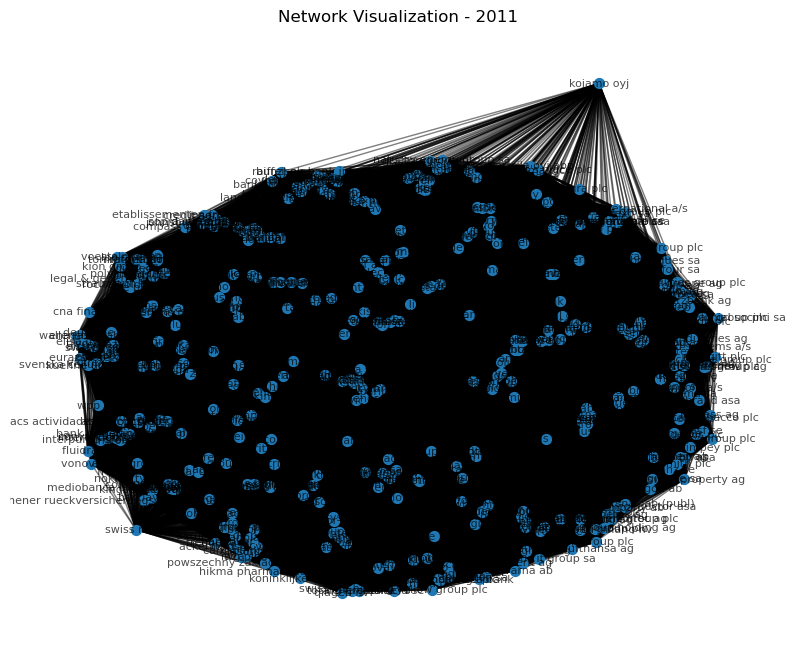

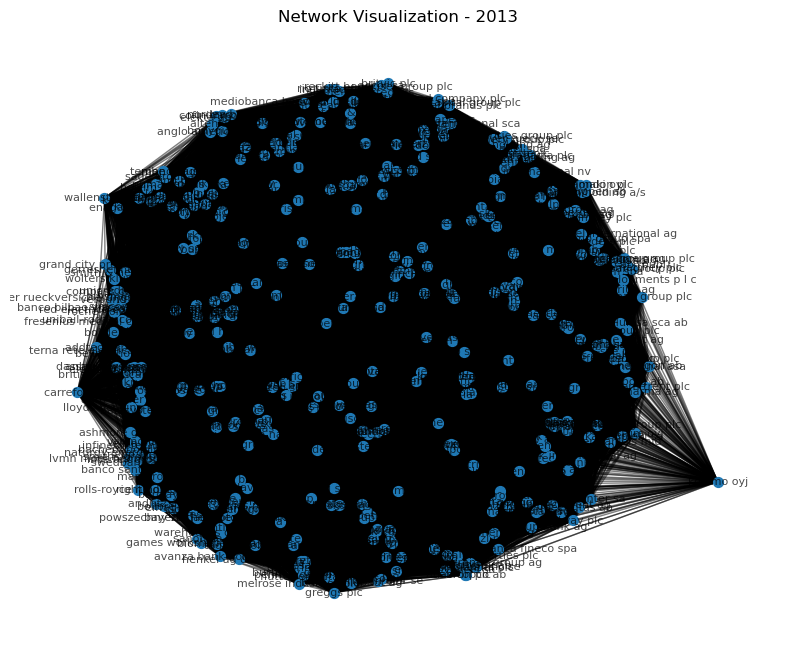

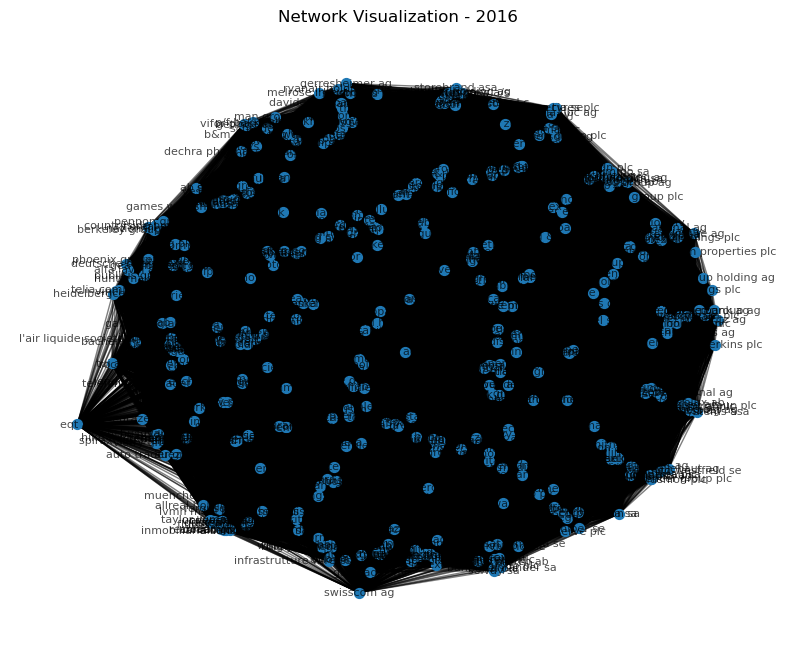

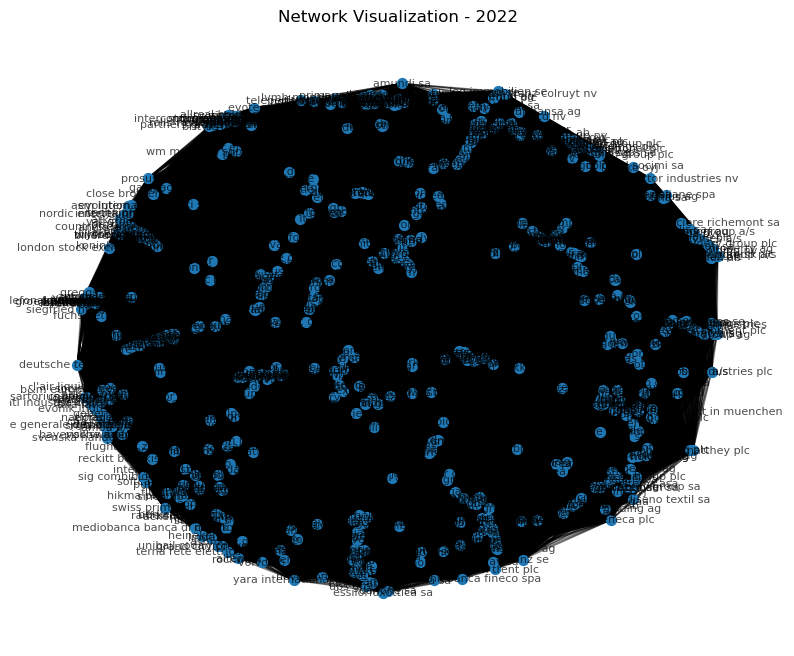

In [18]:
# Function to create a NetworkX graph from a DataFrame
def create_graph(df):
    G = nx.from_pandas_edgelist(df, 'Source', 'Target', ['Common Attributes', 'Weight'])
    return G

# Creating NetworkX graphs for each year
graph_2011 = create_graph(network_2011_merged_lowercase)
graph_2013 = create_graph(network_2013_merged_lowercase)
graph_2016 = create_graph(network_2016_merged_lowercase)
graph_2022 = create_graph(network_2022_merged_lowercase)

# Saving graphs created above in gexf format
nx.write_gexf(graph_2011, "graph_2011.gexf")
nx.write_gexf(graph_2013, "graph_2013.gexf")
nx.write_gexf(graph_2016, "graph_2016.gexf")
nx.write_gexf(graph_2022, "graph_2022.gexf")

# Creating graphs for each year and storing them together
graphs = {
    '2011': create_graph(network_2011_merged_lowercase),
    '2013': create_graph(network_2013_merged_lowercase),
    '2016': create_graph(network_2016_merged_lowercase),
    '2022': create_graph(network_2022_merged_lowercase)
}

# Function to visualize a NetworkX graph
def visualize_graph(G, title):
    plt.figure(figsize=(10, 8))
    pos = nx.spring_layout(G, seed=42)  # positions for all nodes
    
    # Drawing nodes, edges, and labels
    nx.draw_networkx_nodes(G, pos, node_size=50)
    nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5)
    nx.draw_networkx_labels(G, pos, font_size=8, alpha=0.7)
    
    plt.title(title)
    plt.axis("off")
    plt.show()

# Visualizing the networks for 2011, 2013, and 2016
visualize_graph(graph_2011, 'Network Visualization - 2011')
visualize_graph(graph_2013, 'Network Visualization - 2013')
visualize_graph(graph_2016, 'Network Visualization - 2016')
visualize_graph(graph_2022, 'Network Visualization - 2022')


### Alternative but unused plotting approach using gravis

Abandoned due to the additional use of the Gephi software to explore the networks.

In [ ]:
# Plotting graphis with their properties using gravis
def assign_properties(g):
    # Centrality calculation
    node_centralities = nx.eigenvector_centrality(g)
    edge_centralities = nx.edge_betweenness_centrality(g)

    # Community detection
    communities = nx.algorithms.community.greedy_modularity_communities(g)

    # Graph properties
    g.graph['node_border_size'] = 1.5
    g.graph['node_border_color'] = 'white'
    g.graph['edge_opacity'] = 0.9

    # Node properties: Size by centrality, shape by size, color by community
    colors = ['red', 'blue', 'green', 'orange', 'pink', 'brown', 'yellow', 'cyan', 'magenta', 'violet']
    for node_id in g.nodes:
        node = g.nodes[node_id]
        node['size'] = 10 + node_centralities[node_id] * 100
        node['shape'] = 'rectangle' if node['size'] > 30 else 'circle'
        for community_counter, community_members in enumerate(communities):
            if node_id in community_members:
                break
        node['color'] = colors[community_counter % len(colors)]

    # Edge properties: Size by centrality, color by community (within=community color, between=black)
    for edge_id in g.edges:
        edge =  g.edges[edge_id]
        source_node = g.nodes[edge_id[0]]
        target_node = g.nodes[edge_id[1]]
        edge['size'] = edge_centralities[edge_id] * 100
        edge['color'] = source_node['color'] if source_node['color'] == target_node['color'] else 'black'

# Assign node and edge properties
#graph_2011_incl_prop = graph_2011
#assign_properties(graph_2011_incl_prop)

# Plot the new graph with properties
#gv.d3(graph_2011_incl_prop, zoom_factor=0.2)


## Network Metrics


In [19]:
# Function to calculate various network metrics
def calculate_network_metrics(G):
    metrics = {}
    metrics['Number of Nodes'] = nx.number_of_nodes(G)
    metrics['Number of Edges'] = nx.number_of_edges(G)
    metrics['Average Degree'] = sum(dict(G.degree()).values()) / len(G)
    metrics['Density'] = nx.density(G)
    metrics['Average Clustering Coefficient'] = nx.average_clustering(G)
    metrics['Diameter'] = nx.diameter(G) if nx.is_connected(G) else np.nan
    metrics['Average Shortest Path Length'] = nx.average_shortest_path_length(G) if nx.is_connected(G) else np.nan
    metrics['Connected Components'] = nx.number_connected_components(G)
    
    # Additional Metrics
    # Modularity (Community Detection)
    try:
        communities = nx.algorithms.community.greedy_modularity_communities(G)
        metrics['Modularity'] = nx.algorithms.community.modularity(G, communities)
    except:
        metrics['Modularity'] = "Not Computable"

    # Assortativity
    metrics['Assortativity Coefficient'] = nx.degree_assortativity_coefficient(G)

    # Edge Weight Analysis
    weights = [attr['Weight'] for _, _, attr in G.edges(data=True)]
    metrics['Average Edge Weight'] = sum(weights) / len(weights) if weights else 0

    # PageRank (if the graph is not too large)
    if len(G) < 10000:  # Adjust this threshold based on graph size and computational resources
        metrics['PageRank'] = nx.pagerank(G)
        
    # Calculating centralities
    metrics['Degree Centrality'] = nx.degree_centrality(G)
    metrics['Betweenness Centrality'] = nx.betweenness_centrality(G)
    metrics['Closeness Centrality'] = nx.closeness_centrality(G)
    metrics['Eigenvector Centrality'] = nx.eigenvector_centrality(G, max_iter=1000)

    return metrics

# Calculating network metrics for each year
metrics_2011 = calculate_network_metrics(graph_2011)
metrics_2013 = calculate_network_metrics(graph_2013)
metrics_2016 = calculate_network_metrics(graph_2016)
metrics_2022 = calculate_network_metrics(graph_2022)

# Calculating metrics for each year together
metrics_by_year = {year: calculate_network_metrics(graph) for year, graph in graphs.items()}

# Displaying basic network metrics
#pd.DataFrame({
#    "2011": [metrics_2011['Number of Nodes'], metrics_2011['Number of Edges'], metrics_2011['Average Degree'], metrics_2011['Density'], metrics_2011['Average Clustering Coefficient'], metrics_2011['Diameter'], metrics_2011['Average Shortest Path Length'], metrics_2011['Connected Components']],
#    "2013": [metrics_2013['Number of Nodes'], metrics_2013['Number of Edges'], metrics_2013['Average Degree'], metrics_2013['Density'], metrics_2013['Average Clustering Coefficient'], metrics_2013['Diameter'], metrics_2013['Average Shortest Path Length'], metrics_2013['Connected Components']],
#    "2016": [metrics_2016['Number of Nodes'], metrics_2016['Number of Edges'], metrics_2016['Average Degree'], metrics_2016['Density'], metrics_2016['Average Clustering Coefficient'], metrics_2016['Diameter'], metrics_2016['Average Shortest Path Length'], metrics_2016['Connected Components']],
#    "2022": [metrics_2022['Number of Nodes'], metrics_2022['Number of Edges'], metrics_2022['Average Degree'], metrics_2022['Density'], metrics_2022['Average Clustering Coefficient'], metrics_2022['Diameter'], metrics_2022['Average Shortest Path Length'], metrics_2022['Connected Components']]
#}, index=['Number of Nodes', 'Number of Edges', 'Average Degree', 'Density', 'Average Clustering Coefficient', 'Diameter', 'Average Shortest Path Length', 'Connected Components'])

# List of metric keys
metric_keys = ['Number of Nodes', 'Number of Edges', 'Average Degree', 'Density', 'Average Clustering Coefficient', 'Diameter', 'Average Shortest Path Length', 'Connected Components', 'Modularity', 'Assortativity Coefficient', 'Average Edge Weight']

# Function to safely extract metrics
def safe_extract(metrics, key):
    return metrics[key] if key in metrics else None

# Create a dictionary for DataFrame construction
metrics_dict = {year: [safe_extract(metrics, key) for key in metric_keys] for year, metrics in metrics_by_year.items()}

# Construct the DataFrame
metrics_df = pd.DataFrame(metrics_dict, index=metric_keys)

metrics_df


,2011,2013,2016,2022
Number of Nodes,433.000000,4.260000e+02,413.000000,594.000000
Number of Edges,92883.000000,9.005100e+04,84958.000000,175945.000000
Average Degree,429.020785,4.227746e+02,411.418886,592.407407
Density,0.993104,9.947639e-01,0.998590,0.999001
Average Clustering Coefficient,0.994904,9.963700e-01,0.998729,0.999141
Diameter,2.000000,2.000000e+00,2.000000,2.000000
Average Shortest Path Length,1.006896,1.005236e+00,1.001410,1.000999
Connected Components,1.000000,1.000000e+00,1.000000,1.000000
Modularity,0.000875,1.110223e-16,0.000000,0.000000
Assortativity Coefficient,-0.017292,-1.093260e-02,-0.011194,-0.006756


### Key Players


In [20]:
# Function to identify key players based on various centralities
def identify_key_players(metrics, top_n=5):
    key_players = {}
    key_players['Degree Centrality'] = sorted(metrics['Degree Centrality'].items(), key=lambda x: x[1], reverse=True)[:top_n]
    key_players['Betweenness Centrality'] = sorted(metrics['Betweenness Centrality'].items(), key=lambda x: x[1], reverse=True)[:top_n]
    key_players['Closeness Centrality'] = sorted(metrics['Closeness Centrality'].items(), key=lambda x: x[1], reverse=True)[:top_n]
    key_players['Eigenvector Centrality'] = sorted(metrics['Eigenvector Centrality'].items(), key=lambda x: x[1], reverse=True)[:top_n]
    return key_players

# Identifying key players in the network for each year
key_players_2011 = identify_key_players(metrics_2011)
key_players_2013 = identify_key_players(metrics_2013)
key_players_2016 = identify_key_players(metrics_2016)
key_players_2022 = identify_key_players(metrics_2022)


# Displaying key players
pd.DataFrame({
    "2011 Degree Centrality": key_players_2011['Degree Centrality'],
    "2011 Betweenness Centrality": key_players_2011['Betweenness Centrality'],
    "2011 Closeness Centrality": key_players_2011['Closeness Centrality'],
    "2011 Eigenvector Centrality": key_players_2011['Eigenvector Centrality'],
    "2013 Degree Centrality": key_players_2013['Degree Centrality'],
    "2013 Betweenness Centrality": key_players_2013['Betweenness Centrality'],
    "2013 Closeness Centrality": key_players_2013['Closeness Centrality'],
    "2013 Eigenvector Centrality": key_players_2013['Eigenvector Centrality'],
    "2016 Degree Centrality": key_players_2016['Degree Centrality'],
    "2016 Betweenness Centrality": key_players_2016['Betweenness Centrality'],
    "2016 Closeness Centrality": key_players_2016['Closeness Centrality'],
    "2016 Eigenvector Centrality": key_players_2016['Eigenvector Centrality'],
    "2022 Degree Centrality": key_players_2022['Degree Centrality'],
    "2022 Betweenness Centrality": key_players_2022['Betweenness Centrality'],
    "2022 Closeness Centrality": key_players_2022['Closeness Centrality'],
    "2022 Eigenvector Centrality": key_players_2022['Eigenvector Centrality'],
}, index=[f"Top {i+1}" for i in range(5)])


,2011 Degree Centrality,2011 Betweenness Centrality,2011 Closeness Centrality,2011 Eigenvector Centrality,2013 Degree Centrality,2013 Betweenness Centrality,2013 Closeness Centrality,2013 Eigenvector Centrality,2016 Degree Centrality,2016 Betweenness Centrality,2016 Closeness Centrality,2016 Eigenvector Centrality,2022 Degree Centrality,2022 Betweenness Centrality,2022 Closeness Centrality,2022 Eigenvector Centrality
Top 1,"(erste group bank ag, 1.0)","(erste group bank ag, 2.4222862246659817e-05)","(erste group bank ag, 1.0)",(recordati industria chimica e farmaceutica sp...,"(raiffeisen bank international ag, 0.999999999...","(raiffeisen bank international ag, 2.044512834...","(raiffeisen bank international ag, 1.0)","(raiffeisen bank international ag, 0.048645970...","(erste group bank ag, 0.9999999999999999)","(erste group bank ag, 3.850510399154933e-06)","(erste group bank ag, 1.0)","(erste group bank ag, 0.04927082367107947)","(raiffeisen bank international ag, 1.0)","(raiffeisen bank international ag, 1.990156320...","(raiffeisen bank international ag, 1.0)","(raiffeisen bank international ag, 0.041067099..."
Top 2,"(andritz ag, 1.0)","(andritz ag, 2.4222862246659817e-05)","(andritz ag, 1.0)","(wpp plc, 0.048324599833661046)","(andritz ag, 0.9999999999999999)","(andritz ag, 2.0445128347843175e-05)","(andritz ag, 1.0)","(andritz ag, 0.04864597062160853)","(raiffeisen bank international ag, 0.999999999...","(raiffeisen bank international ag, 3.850510399...","(raiffeisen bank international ag, 1.0)","(raiffeisen bank international ag, 0.049270823...","(andritz ag, 1.0)","(andritz ag, 1.9901563203599453e-06)","(andritz ag, 1.0)","(andritz ag, 0.04106709997107312)"
Top 3,"(wienerberger ag, 1.0)","(wienerberger ag, 2.4222862246659817e-05)","(wienerberger ag, 1.0)","(ferguson plc, 0.048324599833661046)","(wienerberger ag, 0.9999999999999999)","(wienerberger ag, 2.0445128347843175e-05)","(wienerberger ag, 1.0)","(wienerberger ag, 0.04864597062160853)","(andritz ag, 0.9999999999999999)","(andritz ag, 3.850510399154933e-06)","(andritz ag, 1.0)","(andritz ag, 0.04927082367107947)","(omv ag, 1.0)","(omv ag, 1.9901563203599453e-06)","(omv ag, 1.0)","(omv ag, 0.04106709997107312)"
Top 4,"(ams ag, 1.0)","(ams ag, 2.4222862246659817e-05)","(ams ag, 1.0)","(arcelormittal sa, 0.048324599833661046)","(solvay sa, 0.9999999999999999)","(solvay sa, 2.0445128347843175e-05)","(solvay sa, 1.0)","(solvay sa, 0.04864597062160853)","(omv ag, 0.9999999999999999)","(omv ag, 3.850510399154933e-06)","(omv ag, 1.0)","(omv ag, 0.04927082367107947)","(voestalpine ag, 1.0)","(voestalpine ag, 1.9901563203599453e-06)","(voestalpine ag, 1.0)","(voestalpine ag, 0.04106709997107312)"
Top 5,"(solvay sa, 1.0)","(solvay sa, 2.4222862246659817e-05)","(solvay sa, 1.0)","(heineken nv, 0.048324599833661046)","(ucb sa, 0.9999999999999999)","(ucb sa, 2.0445128347843175e-05)","(ucb sa, 1.0)","(ucb sa, 0.04864597062160853)","(voestalpine ag, 0.9999999999999999)","(voestalpine ag, 3.850510399154933e-06)","(voestalpine ag, 1.0)","(voestalpine ag, 0.04927082367107947)","(ams ag, 1.0)","(ams ag, 1.9901563203599453e-06)","(ams ag, 1.0)","(ams ag, 0.04106709997107312)"


In [21]:
# Function to find not connected nodes
def find_not_connected_nodes(G):
    not_connected_nodes = [node for node in G.nodes if G.degree(node) == 0]
    return not_connected_nodes

# Finding not connected nodes for each year
not_connected_nodes_2011 = find_not_connected_nodes(graph_2011)
not_connected_nodes_2013 = find_not_connected_nodes(graph_2013)
not_connected_nodes_2016 = find_not_connected_nodes(graph_2016)
not_connected_nodes_2022 = find_not_connected_nodes(graph_2022)

# Displaying not connected nodes
len(not_connected_nodes_2011), not_connected_nodes_2011, len(not_connected_nodes_2013), not_connected_nodes_2013, len(not_connected_nodes_2016), not_connected_nodes_2016, len(not_connected_nodes_2022), not_connected_nodes_2022


(0, [], 0, [], 0, [], 0, [])

C:\Users\Markus\AppData\Local\Temp\ipykernel_12764\2329284825.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  edge_color_map = plt.cm.get_cmap('coolwarm')


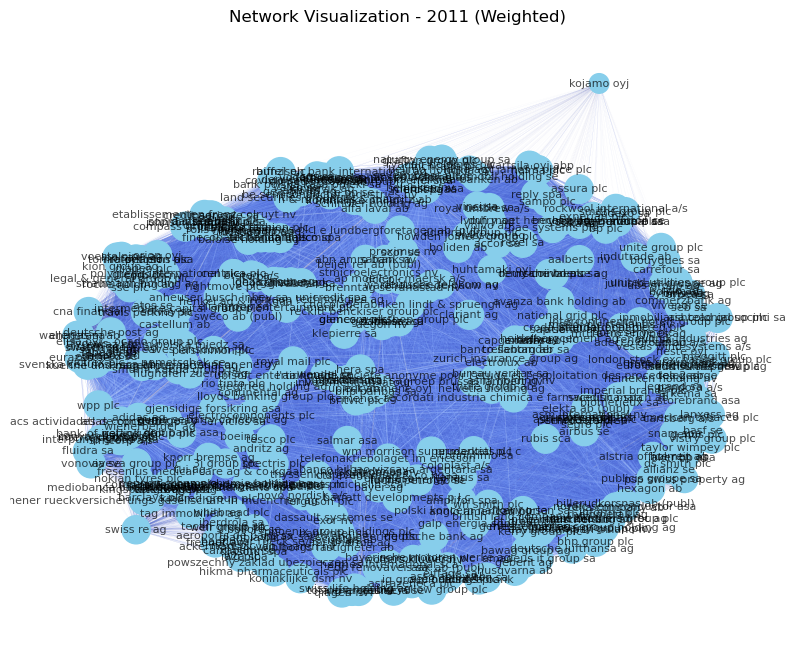

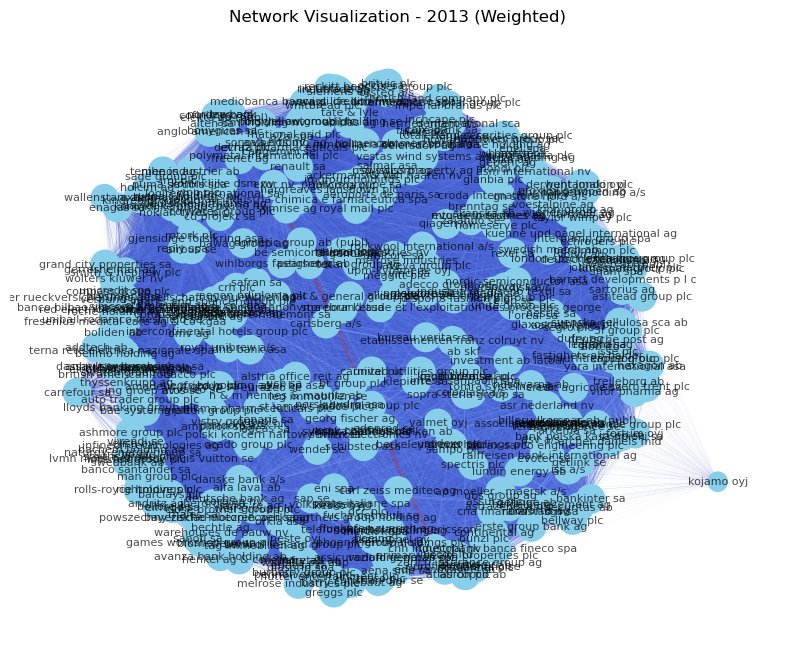

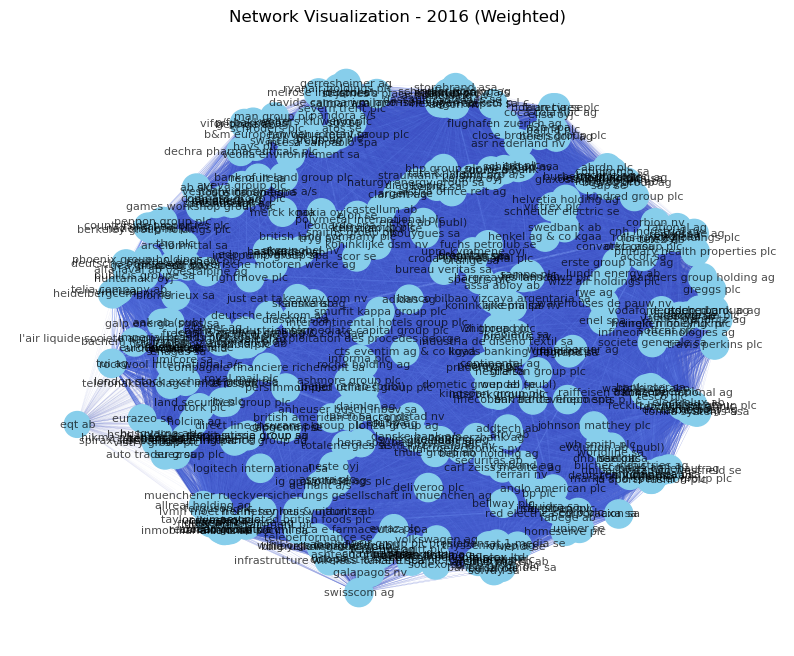

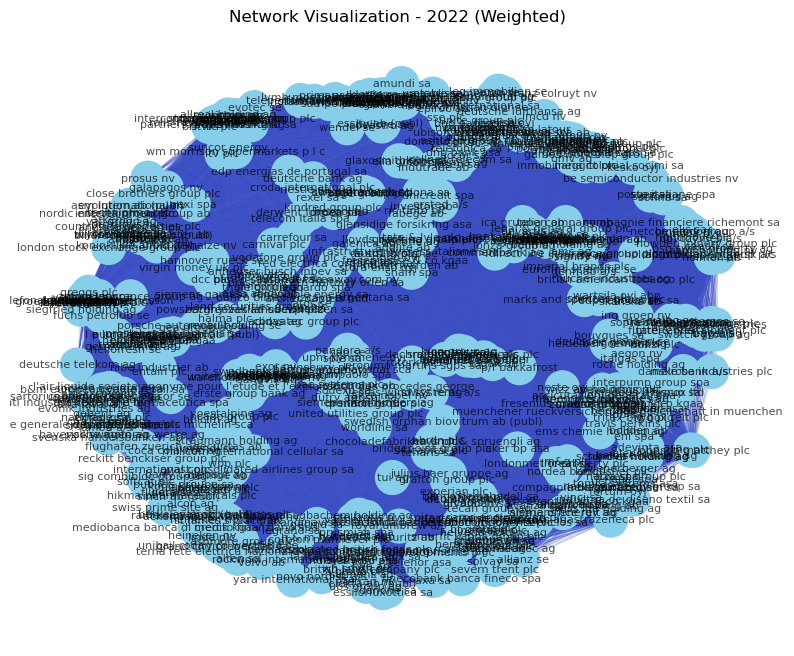

In [22]:
# Function to visualize a NetworkX graph with weighted edges and node sizes based on degree
def visualize_graph_weighted(G, title):
    plt.figure(figsize=(10, 8))
    pos = nx.spring_layout(G, seed=42)  # positions for all nodes
    
    # Extracting weights and degrees
    weights = nx.get_edge_attributes(G, 'Weight').values()
    degrees = [G.degree(n) for n in G.nodes]
    widths = [d['Weight'] / 100 for _, _, d in G.edges(data=True)]
    
    # Using a colormap to map weights to colors
    edge_colors = [d['Weight'] for _, _, d in G.edges(data=True)]
    edge_color_map = plt.cm.get_cmap('coolwarm')

    # Drawing nodes, edges, and labels
    nx.draw_networkx_nodes(G, pos, node_size=degrees, node_color='skyblue')
    nx.draw_networkx_edges(G, pos, width=widths, alpha=0.5, edge_color=edge_colors, edge_cmap=edge_color_map)
    nx.draw_networkx_labels(G, pos, font_size=8, alpha=0.7)
    
    plt.title(title)
    plt.axis("off")
    plt.show()

# Visualizing the networks for 2011, 2013, and 2016 with weights and node sizes
visualize_graph_weighted(graph_2011, 'Network Visualization - 2011 (Weighted)')
visualize_graph_weighted(graph_2013, 'Network Visualization - 2013 (Weighted)')
visualize_graph_weighted(graph_2016, 'Network Visualization - 2016 (Weighted)')
visualize_graph_weighted(graph_2022, 'Network Visualization - 2022 (Weighted)')


# Network Analysis
## Network Metrics Comparison
### Basic Network Metrics:
- Number of Nodes: The total count of unique companies in the network.
- Number of Edges: The total count of connections between companies.
- Average Degree: The average number of connections each company has.
- Density: A measure of how many connections exist compared to how many are possible. A density close to 1 means the network is highly connected.
- Average Clustering Coefficient: A measure of the degree to which nodes in a network tend to cluster together. A high average clustering coefficient indicates a high degree of clustering.
- Diameter: The longest shortest path between any two nodes in the network. A smaller diameter indicates a more tightly connected network.
- Average Shortest Path Length: The average length of the shortest path between all pairs of nodes. A smaller average shortest path length indicates a more tightly connected network.
- Connected Components: The number of connected subgraphs in the network. A single connected component indicates a fully connected network.
- Modularity: Reflects the network's division into communities. High modularity suggests dense connections within communities and sparse connections between them.
- Assortativity Coefficient: Measures the tendency of nodes to connect to similar nodes, especially in terms of node degree. Positive values indicatating connections between similar nodes, and vice-versa for the negative values.
- Average Edge Weight: The average strength of connections between nodes, with higher values indicating stronger connections.


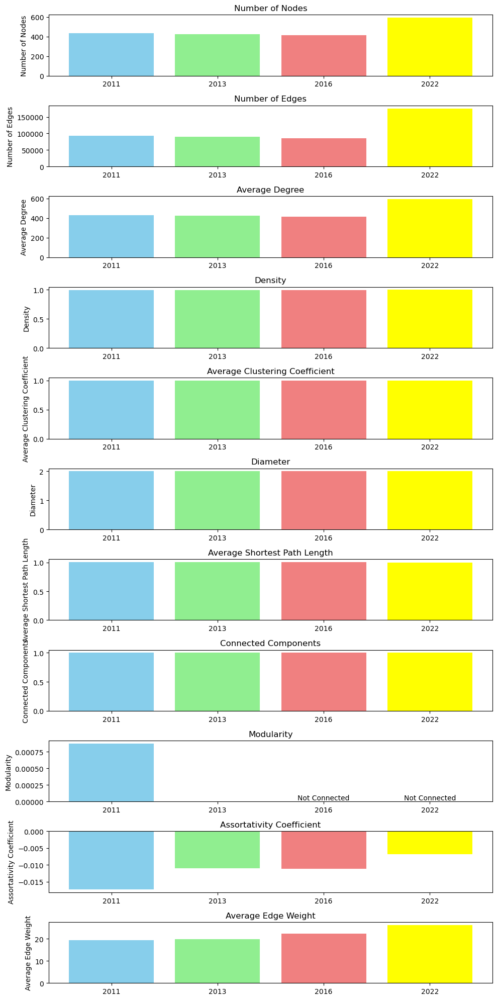

In [23]:
# Metrics for each year
metrics_data = {
    "2011": metrics_2011,
    "2013": metrics_2013,
    "2016": metrics_2016,
    "2022": metrics_2022
}

# Metrics to be visualized
metric_names = ["Number of Nodes", "Number of Edges", "Average Degree", "Density", 
                "Average Clustering Coefficient", "Diameter", "Average Shortest Path Length",
                "Connected Components", 'Modularity', 'Assortativity Coefficient', 'Average Edge Weight']

# Creating a bar chart for each metric
num_metrics = len(metric_names)
fig, axs = plt.subplots(num_metrics, figsize=(10, 20))

for i, metric in enumerate(metric_names):
    values = []
    for year in ["2011", "2013", "2016", "2022"]:
        if isinstance(metrics_data[year][metric], (int, float)):
            values.append(metrics_data[year][metric])
        else:
            values.append(0)

    bars = axs[i].bar(["2011", "2013", "2016", "2022"], values, color=['skyblue', 'lightgreen', 'lightcoral', 'yellow'])
    axs[i].set_title(metric)
    axs[i].set_ylabel(metric)

    # Add text labels for non-numeric values
    for bar, value in zip(bars, values):
        if value == 0:
            height = bar.get_height()
            axs[i].text(bar.get_x() + bar.get_width() / 2, height, 'Not Connected',
                        ha='center', va='bottom')

plt.tight_layout()
plt.show()


- Number of Nodes:
    - There is an initial decrease from 315 in 2011 to 310 in 2013, followed by a significant drop to 232 in 2016. However, by 2023, the number of nodes dramatically increases to 598, suggesting a major expansion or integration of new elements into the network.
- Number of Edges:
    - The number of edges decreases consistently from 49,223 in 2011 to 26,795 in 2016, indicating a reduction in connections between nodes. However, in 2023, the number further drops to 34,560, which is interesting given the increase in nodes, suggesting that the new nodes are less interconnected.
- Average Degree:
    - This metric, which indicates the average number of connections per node, decreases over time from 312.53 in 2011 to 115.59 in 2023, aligning with the trend observed in the number of edges.
- Density:
    - The network's density, indicating how close the network is to being fully connected, shows a dramatic change. It remains almost fully connected until 2016 (close to 1) and then drops significantly to 0.1936 in 2023. This suggests the network became much less interconnected over time, especially after 2016.
- Average Clustering Coefficient:#
    - This measures the degree to which nodes in the network tend to cluster together. It remains very high (close to 1) until 2016, indicating a highly interconnected network, and then drops to 0.6027 in 2023, suggesting a decrease in local node clustering.
- Diameter:
    - The diameter, or the longest shortest path between any two nodes, increases from 2 to 3 in 2023, indicating that the network has become slightly more spread out.
- Average Shortest Path Length:
    - This increases significantly from 1.004 in 2011 to 1.822 in 2023, aligning with the increase in the network's diameter and indicating that, on average, it takes more steps to get from one node to another.
- Connected Components:
    - Remains at 1 throughout the years, indicating that the network is always connected as a single component without isolated subnetworks.
- Modularity:
    - This metric measures the strength of division of a network into modules. The significant increase in 2023 to 0.2665 suggests the network has developed a more modular structure with distinct communities or clusters.
- Assortativity Coefficient:
    - This transition from negative values to a positive value of 0.4145 in 2023 indicates a shift from a network where nodes tend not to connect to similar others (disassortative) to one where similar nodes are more likely to be connected (assortative).
- Average Edge Weight:
    - This indicates the average strength or capacity of connections in the network. It increases over time, which could suggest that while the number of connections decreases, the remaining connections become stronger or more significant.


### Centrality Distributions
- Degree Centrality: The number of direct connections a node has.
- Betweenness Centrality: The number of shortest paths that pass through a node.
- Closeness Centrality: The average length of the shortest paths from a node to all other nodes.
- Eigenvector Centrality: A measure of a node's influence based on the connections of its neighbors.
- PageRank: A measure of a node's importance based on the quantity and quality of links to it. Nodes with high PageRank are connected to many nodes that are themselves important.


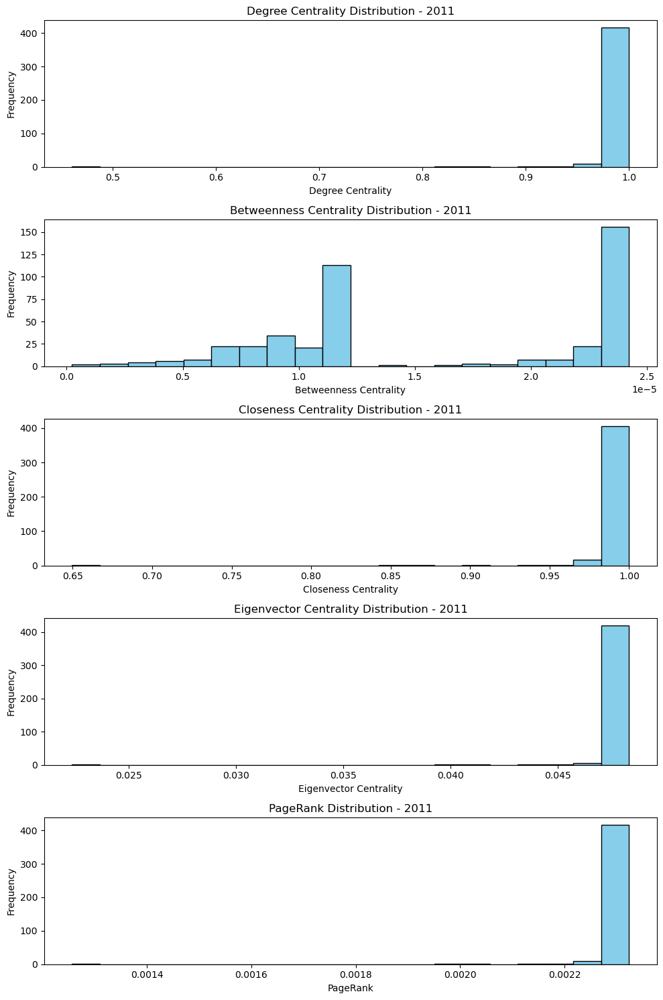

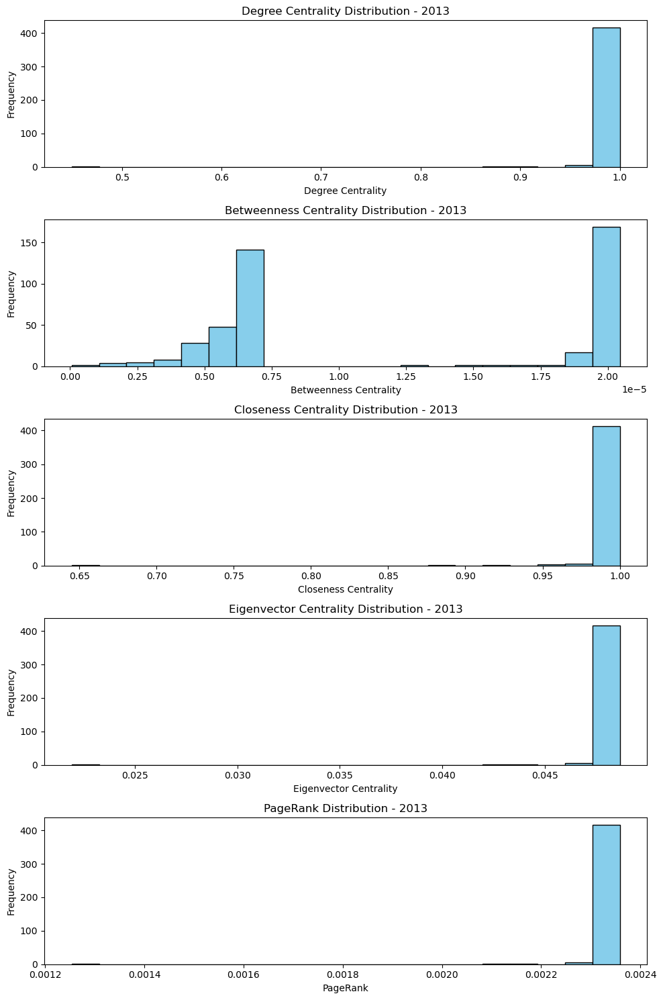

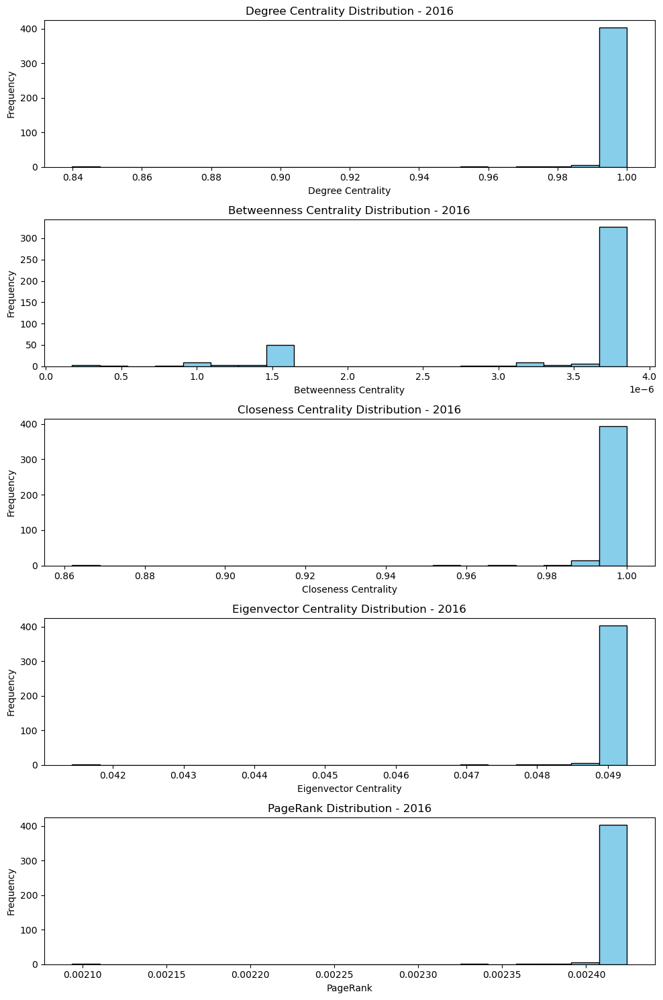

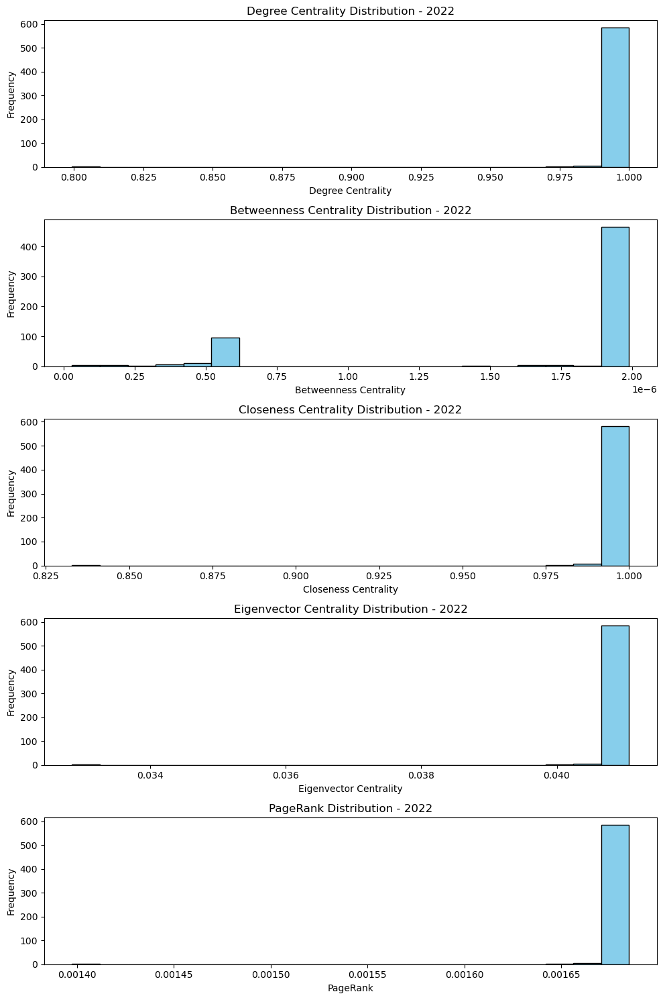

In [24]:
# Function to plot the distribution of centrality measures
def plot_centrality_distributions(metrics, metric_names, year):
    num_metrics = len(metric_names)
    fig, axs = plt.subplots(num_metrics, 1, figsize=(10, 15))
    
    for i, metric in enumerate(metric_names):
        values = list(metrics[metric].values())
        axs[i].hist(values, bins=20, color='skyblue', edgecolor='black')
        axs[i].set_title(f'{metric} Distribution - {year}')
        axs[i].set_xlabel(metric)
        axs[i].set_ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()

# Centrality measures to be visualized
centrality_metric_names = ["Degree Centrality", "Betweenness Centrality", "Closeness Centrality", "Eigenvector Centrality", 'PageRank']

# Plotting centrality distributions for each year
plot_centrality_distributions(metrics_2011, centrality_metric_names, "2011")
plot_centrality_distributions(metrics_2013, centrality_metric_names, "2013")
plot_centrality_distributions(metrics_2016, centrality_metric_names, "2016")
plot_centrality_distributions(metrics_2022, centrality_metric_names, "2022")


- Degree Centrality Distribution:
    - In 2011 and 2013, the distribution is heavily right-skewed, with most nodes having a high degree centrality, indicating that most nodes are highly connected.
    - In 2016, the distribution is nearly a delta function at very high degree centrality, suggesting an even more interconnected network where almost all nodes have a similar, high number of connections.
    - By 2023, the distribution becomes more uniform with a wide range of degree centralities, indicating a diversification in the number of connections per node.
- Betweenness Centrality Distribution:
    - In 2011 and 2013, there's a concentration at lower betweenness centrality values with a long tail, suggesting a few nodes act as significant bridges in the network.
    - In 2016, the distribution is extremely peaked at the low end, implying that fewer nodes are serving as bridges.
    - In 2023, the distribution is more spread out, which could mean that the role of bridge nodes is more evenly distributed across the network.
- Closeness Centrality Distribution:
    - The distributions in 2011, 2013, and 2016 show a concentration of nodes with high closeness centrality, implying most nodes are close to each other in terms of path lengths.
    - In 2023, the distribution is more spread out, indicating a variation in how close nodes are to each other, reflecting the increased average shortest path length.
- Eigenvector Centrality Distribution:
    - In 2011 and 2013, the distribution shows a concentration at the higher end, suggesting a few nodes are influential within the network.
    - In 2016, the distribution is still skewed towards higher values, but less so than in previous years.
    - By 2023, the distribution has multiple peaks, suggesting that influence is more evenly spread across various nodes in the network.


## Key Players


In [25]:
# Function to identify top key players based on centrality measures
def identify_key_players(metrics, top_n=5):
    key_players = {}
    for metric in centrality_metric_names:
        sorted_companies = sorted(metrics[metric].items(), key=lambda x: x[1], reverse=True)[:top_n]
        key_players[metric] = sorted_companies
    return key_players

# Identifying top key players for each year
key_players_2011 = identify_key_players(metrics_2011)
key_players_2013 = identify_key_players(metrics_2013)
key_players_2016 = identify_key_players(metrics_2016)
key_players_2022 = identify_key_players(metrics_2022)

# Displaying key players
key_players_2011, key_players_2013, key_players_2016, key_players_2022


({'Degree Centrality': [('erste group bank ag', 1.0),
   ('andritz ag', 1.0),
   ('wienerberger ag', 1.0),
   ('ams ag', 1.0),
   ('solvay sa', 1.0)],
  'Betweenness Centrality': [('erste group bank ag', 2.4222862246659817e-05),
   ('andritz ag', 2.4222862246659817e-05),
   ('wienerberger ag', 2.4222862246659817e-05),
   ('ams ag', 2.4222862246659817e-05),
   ('solvay sa', 2.4222862246659817e-05)],
  'Closeness Centrality': [('erste group bank ag', 1.0),
   ('andritz ag', 1.0),
   ('wienerberger ag', 1.0),
   ('ams ag', 1.0),
   ('solvay sa', 1.0)],
  'Eigenvector Centrality': [('recordati industria chimica e farmaceutica spa',
    0.048324599833661046),
   ('wpp plc', 0.048324599833661046),
   ('ferguson plc', 0.048324599833661046),
   ('arcelormittal sa', 0.048324599833661046),
   ('heineken nv', 0.048324599833661046)],
  'PageRank': [('erste group bank ag', 0.002323613633675103),
   ('andritz ag', 0.002323613633675103),
   ('wienerberger ag', 0.002323613633675103),
   ('ams ag', 0.0

- Some companies consistently appear as key players across different years and centrality measures, indicating their significant role in the network.
- Erste Group Bank, Raiffeisen Bank International, and Andritz are prominent key players in 2011, 2016 and 2023, while Andritz also appears as a key player together with Wienerberger and Solvay in 2013.


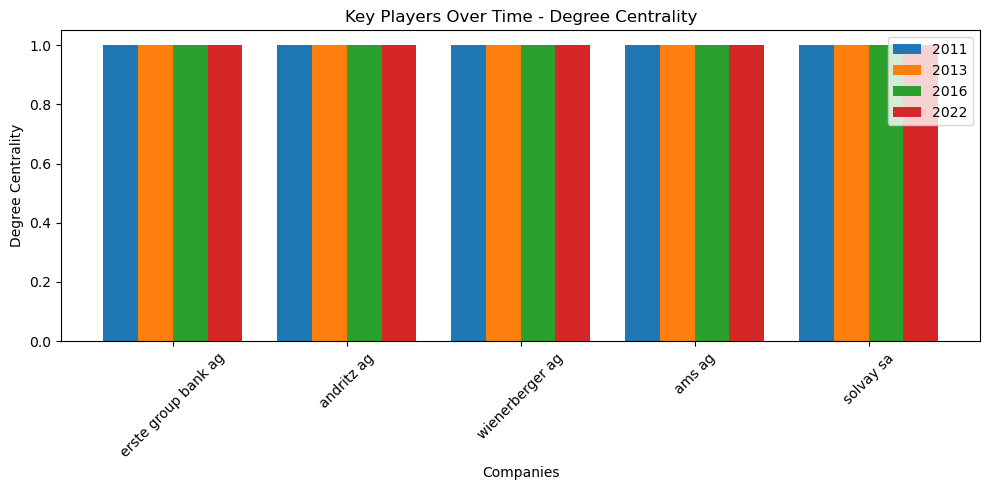

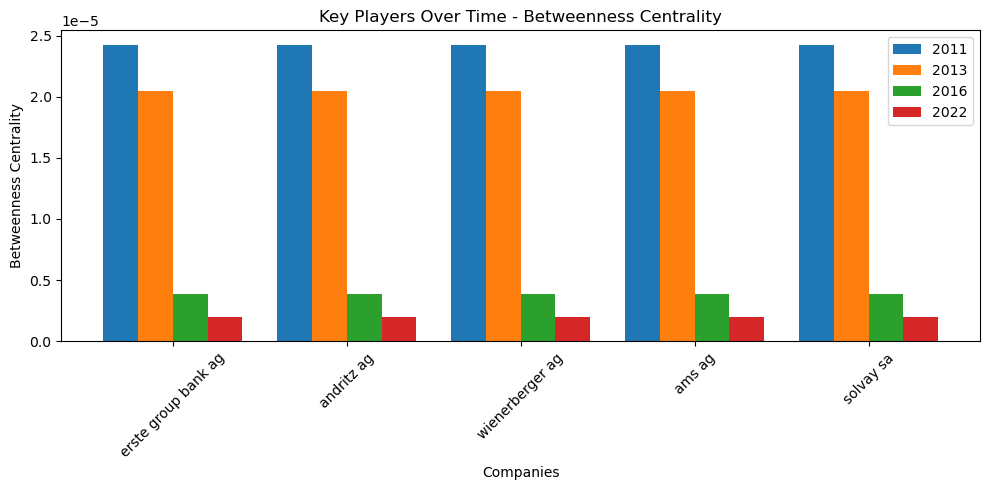

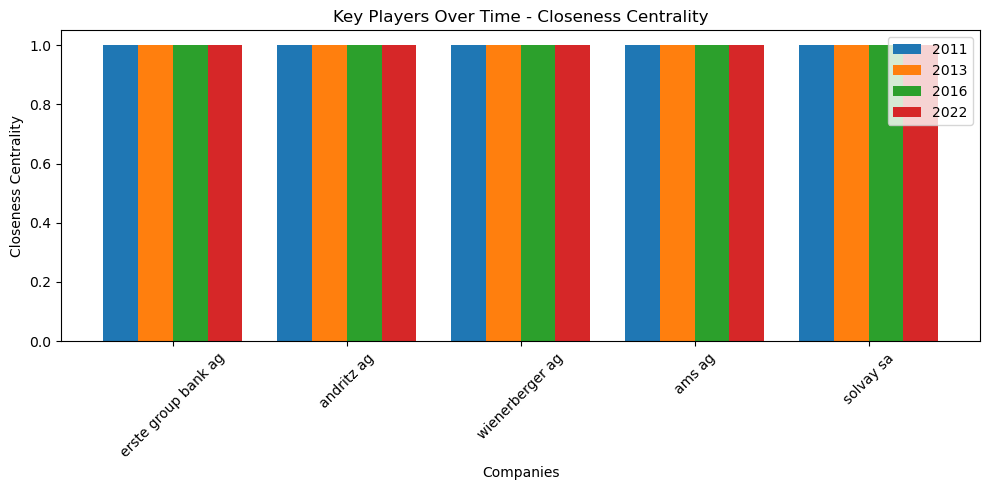

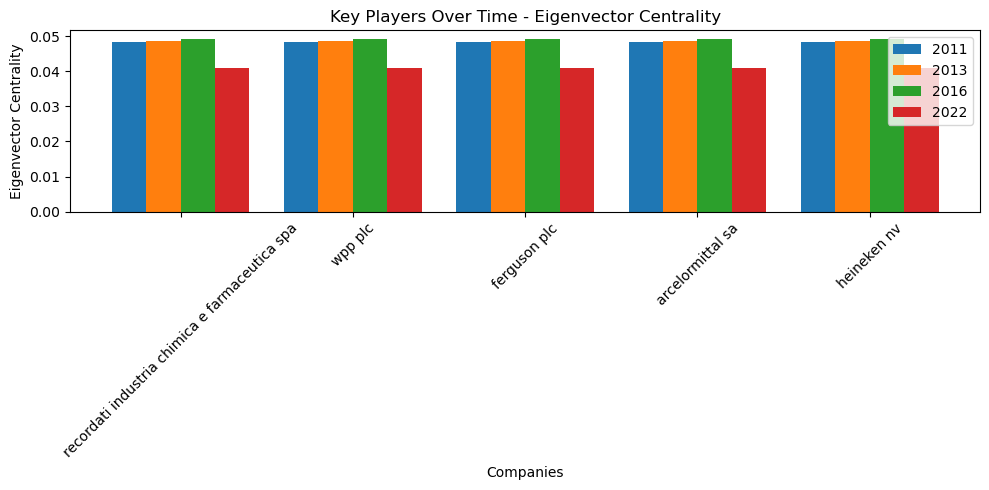

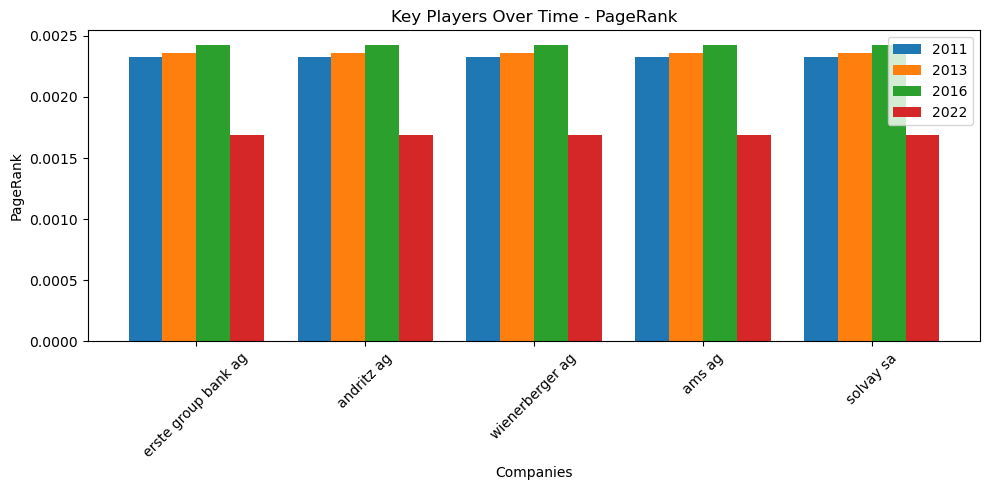

In [26]:
# Plot key players over time
for metric_name in centrality_metric_names:
    plt.figure(figsize=(10, 5))
    
    # Extracting companies and their centrality values for each year
    companies_2011 = [company for company, _ in key_players_2011[metric_name]]
    values_2011 = [value for _, value in key_players_2011[metric_name]]
    
    companies_2013 = [company for company, _ in key_players_2013[metric_name]]
    values_2013 = [value for _, value in key_players_2013[metric_name]]
    
    companies_2016 = [company for company, _ in key_players_2016[metric_name]]
    values_2016 = [value for _, value in key_players_2016[metric_name]]
    
    companies_2022 = [company for company, _ in key_players_2022[metric_name]]
    values_2022 = [value for _, value in key_players_2022[metric_name]]
    
    # Ensure all company lists are the same length for plotting
    max_len = max(len(companies_2011), len(companies_2013), len(companies_2016), len(companies_2022))
    companies_2011 += [""] * (max_len - len(companies_2011))
    companies_2013 += [""] * (max_len - len(companies_2013))
    companies_2016 += [""] * (max_len - len(companies_2016))
    companies_2022 += [""] * (max_len - len(companies_2022))
    
    # Defining the x-axis positions for the bars
    x = np.arange(max_len)
    width = 0.2  # Adjusted for 4 bars
    
    # Creating bar plots
    plt.bar(x - width * 1.5, values_2011, width, label='2011')
    plt.bar(x - width/2, values_2013, width, label='2013')
    plt.bar(x + width/2, values_2016, width, label='2016')
    plt.bar(x + width * 1.5, values_2022, width, label='2022')  # Adding 2022 data
    
    # Adding labels, title, and legend
    plt.xlabel('Companies')
    plt.ylabel(metric_name)
    plt.title(f'Key Players Over Time - {metric_name}')
    plt.xticks(x, companies_2011, rotation=45)
    plt.legend()
    
    plt.tight_layout()
    plt.show()


- 2011 to 2013:
    - The network saw a complete turnover in its key players, indicating possibly disruptive changes in the industry or market.
- 2013 to 2016:
    - Some players from 2011 re-emerged, suggesting either cyclical trends or a return to traditional market structures.
- 2016 to 2023:
    - Another significant shift in key players, with entirely new entities becoming prominent, reflecting the dynamic and evolving nature of the market and possibly global economic shifts.

This analysis shows a network that is highly dynamic, with key players changing significantly over the years, reflecting the evolving landscape of the industry and market forces.


## Important Industries


In [27]:
def aggregate_industry_metrics(network_df, metrics, ciq_data):
    # Merging the CIQ data to get the industry information
    network_df = pd.merge(network_df, ciq_data[['Name', 'IQ_PRIMARY_INDUSTRY']], left_on='Source', right_on='Name', how='left')
    network_df = network_df.rename(columns={'IQ_PRIMARY_INDUSTRY': 'Industry'})
    network_df = network_df.drop(['Name'], axis=1)
    
    # Aggregating network metrics at the industry level
    industry_metrics = {}
    for metric, values in metrics.items():
        if isinstance(values, dict):  # Only process if values is a dictionary
            if metric not in ['Number of Nodes', 'Number of Edges', 'Average Degree', 'Density', 
                              'Average Clustering Coefficient', 'Diameter', 'Average Shortest Path Length',
                              'Connected Components', 'Modularity', 'Assortativity Coefficient',
                              'Average Edge Weight']:
                industry_metric = {}
                for company, value in values.items():
                    industry = network_df.loc[network_df['Source'] == company, 'Industry'].values
                    industry = industry[0] if len(industry) > 0 else None
                    if pd.notna(industry):
                        if industry not in industry_metric:
                            industry_metric[industry] = 0
                        industry_metric[industry] += value
                industry_metrics[metric] = industry_metric
    
    return industry_metrics

# Aggregating network metrics at the industry level for each year
industry_metrics_2011 = aggregate_industry_metrics(network_2011_merged_lowercase, metrics_2011, ciq_data)
industry_metrics_2013 = aggregate_industry_metrics(network_2013_merged_lowercase, metrics_2013, ciq_data)
industry_metrics_2016 = aggregate_industry_metrics(network_2016_merged_lowercase, metrics_2016, ciq_data)
industry_metrics_2022 = aggregate_industry_metrics(network_2022_df, metrics_2022, ciq_data)

# Identifying important industries based on degree centrality for each year
important_industries_2011 = sorted(industry_metrics_2011['Degree Centrality'].items(), key=lambda x: x[1], reverse=True)[:5]
important_industries_2013 = sorted(industry_metrics_2013['Degree Centrality'].items(), key=lambda x: x[1], reverse=True)[:5]
important_industries_2016 = sorted(industry_metrics_2016['Degree Centrality'].items(), key=lambda x: x[1], reverse=True)[:5]
important_industries_2022 = sorted(industry_metrics_2022['Degree Centrality'].items(), key=lambda x: x[1], reverse=True)[:5]

important_industries_2011, important_industries_2013, important_industries_2016, important_industries_2022


([('diversified banks', 25.946759259259256),
  ('industrial machinery and supplies and components', 18.9375),
  ('pharmaceuticals', 12.988425925925926),
  ('specialty chemicals', 12.969907407407407),
  ('trading companies and distributors', 10.953703703703702)],
 [('diversified banks', 24.950588235294113),
  ('industrial machinery and supplies and components', 20.87764705882353),
  ('pharmaceuticals', 13.976470588235294),
  ('specialty chemicals', 12.971764705882354),
  ('trading companies and distributors', 10.908235294117647)],
 [('diversified banks', 21.985436893203882),
  ('industrial machinery and supplies and components', 19.9878640776699),
  ('pharmaceuticals', 13.997572815533978),
  ('specialty chemicals', 12.999999999999998),
  ('trading companies and distributors', 11.975728155339803)],
 [('diversified banks', 32.98650927487353),
  ('industrial machinery and supplies and components', 22.991568296795954),
  ('real estate operating companies', 17.937605396290053),
  ('specialty

- 2011 to 2013:
    - Specialty Chemicals rose in prominence, and Aerospace and Defense appeared as a key industry.
- 2013 to 2016:
    - Diversified Banks became the most central industry, indicating a shift in network dynamics.
- 2016 to 2023:
    - Asset Management and Custody Banks, and Real Estate Operating Companies became more central, while Specialty Chemicals saw a decline in centrality.


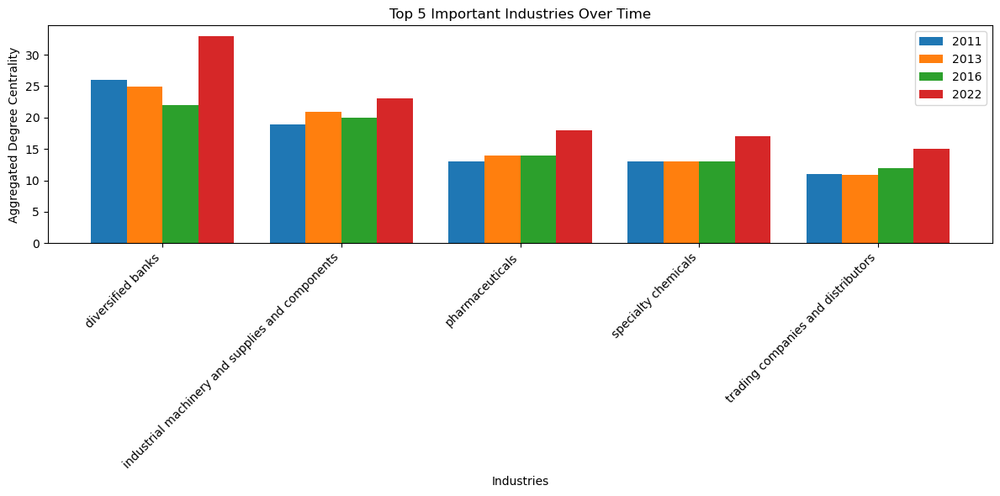

In [28]:
# Function to plot important industries over time
def plot_important_industries_over_time(important_industries_2011, important_industries_2013, important_industries_2016, important_industries_2022, top_n=5):
    # Extracting top industries and their centrality values for each year
    industries_2011, centrality_2011 = zip(*important_industries_2011)
    industries_2013, centrality_2013 = zip(*important_industries_2013)
    industries_2016, centrality_2016 = zip(*important_industries_2016)
    industries_2022, centrality_2022 = zip(*important_industries_2022)
    
    # Creating bar plots
    plt.figure(figsize=(12, 6))
    
    x = np.arange(top_n)
    width = 0.2
    
    # Creating bar plots
    plt.bar(x - width * 1.5, centrality_2011, width, label='2011')
    plt.bar(x - width/2, centrality_2013, width, label='2013')
    plt.bar(x + width/2, centrality_2016, width, label='2016')
    plt.bar(x + width * 1.5, centrality_2022, width, label='2022')
    
    # Adding labels, title, and legend
    plt.xlabel('Industries')
    plt.ylabel('Aggregated Degree Centrality')
    plt.title('Top 5 Important Industries Over Time')
    plt.xticks(x, industries_2011, rotation=45, ha='right')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

# Plotting important industries over time
plot_important_industries_over_time(important_industries_2011, important_industries_2013, important_industries_2016, important_industries_2022)


- Industrial Machinery and Suplies and Components consistently appears as one of the most important industries across all three years, maintaining a high level of centrality.
- Diversified Banks are also consistently prominent.
- All industries have experienced changes in their rankings over time, reflecting shifts in their importance within the network, with all their lowest levels in 2016.


## Clusters/Neighborhoods


In [29]:
# Function to detect communities using the Louvain method
def detect_communities_louvain(G):
    # Compute the best partition
    partition = community_louvain.best_partition(G, resolution=1.)
    
    # Creating a dictionary to store nodes in each community
    community_sizes = {}
    for node, community in partition.items():
        if community not in community_sizes:
            community_sizes[community] = 0
        community_sizes[community] += 1
    
    # Sorting communities by size
    #sorted_communities = sorted(community_sizes.items(), key=lambda x: x[1], reverse=True)
    
    return partition, community_sizes

# Detecting communities for each year using the Louvain method
communities_2011, sorted_communities_2011 = detect_communities_louvain(graph_2011)
communities_2013, sorted_communities_2013 = detect_communities_louvain(graph_2013)
communities_2016, sorted_communities_2016 = detect_communities_louvain(graph_2016)
communities_2022, sorted_communities_2022 = detect_communities_louvain(graph_2022)

# Displaying sorted communities by size
sorted_communities_2011, sorted_communities_2013, sorted_communities_2016, sorted_communities_2022


({0: 192, 1: 241}, {1: 246, 0: 180}, {0: 413}, {0: 594})

- 2011 to 2013:
    - Dynamic balance with slight shifts in community sizes, reflecting a stable yet evolving network structure.
- 2013 to 2016:
    - A period of unification, potentially due to increased collaboration or structural consolidation within the network.
- 2016 to 2023:
    - Significant fragmentation, indicative of a diversification and possibly the development of specialized sectors or groups within the network.


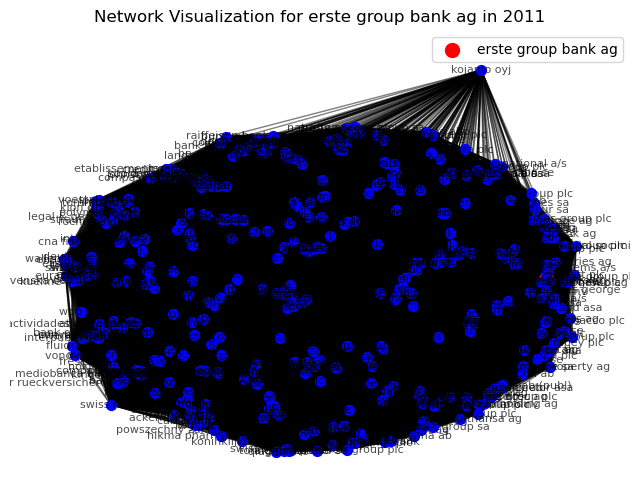

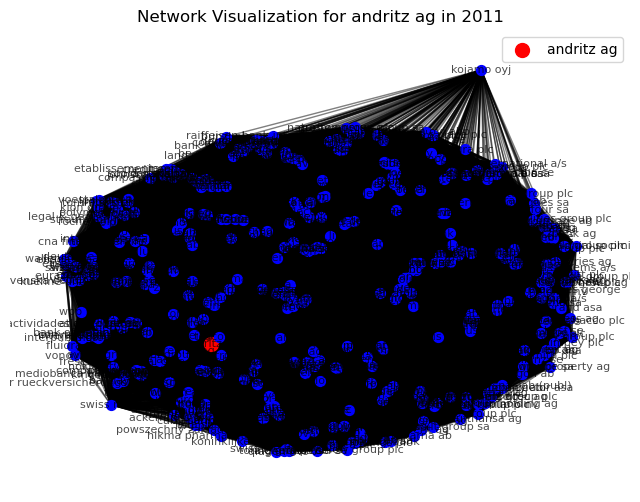

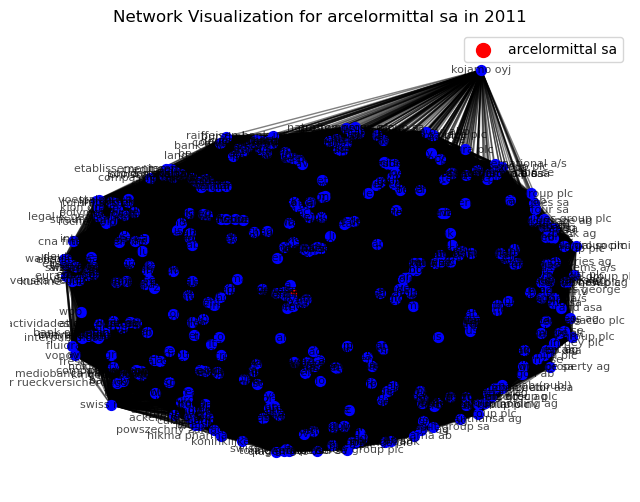

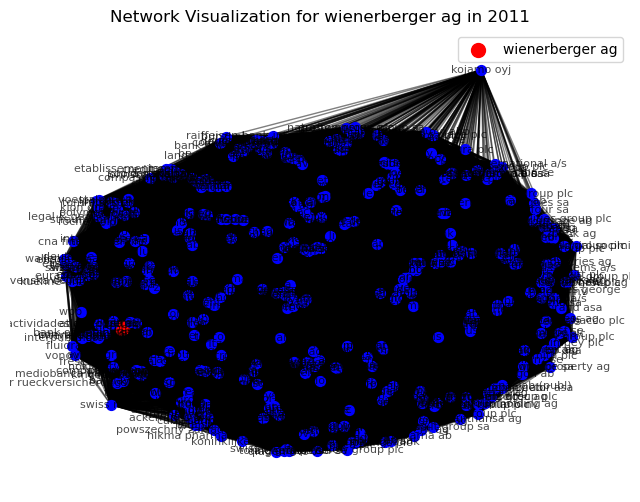

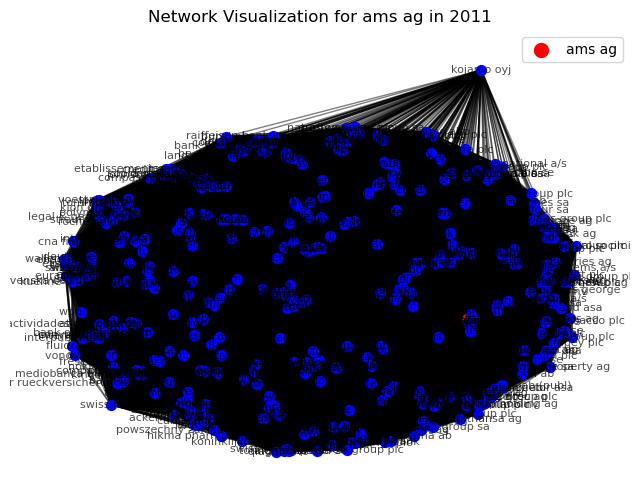

...

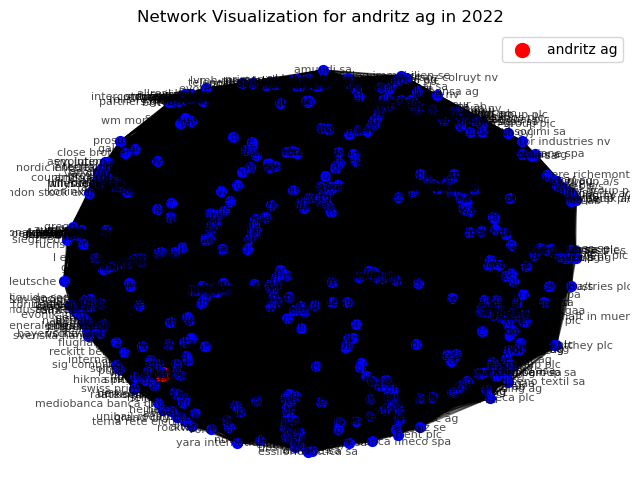

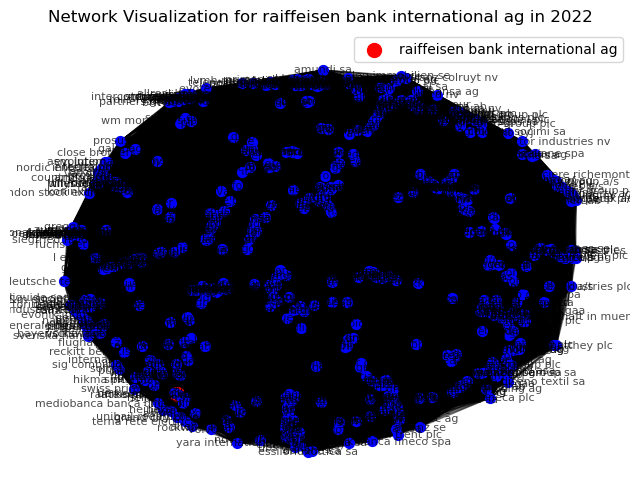

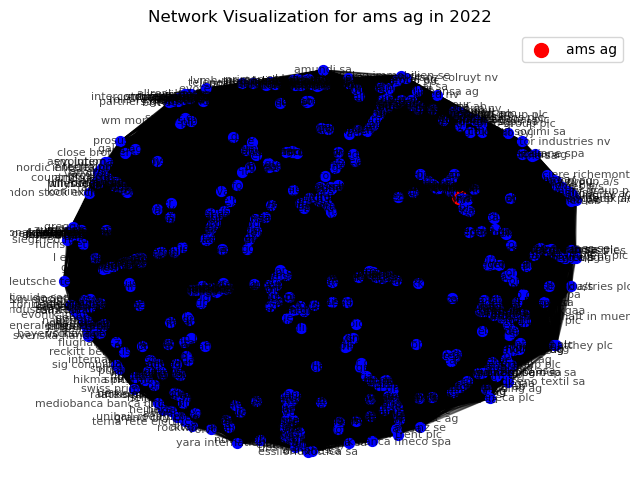

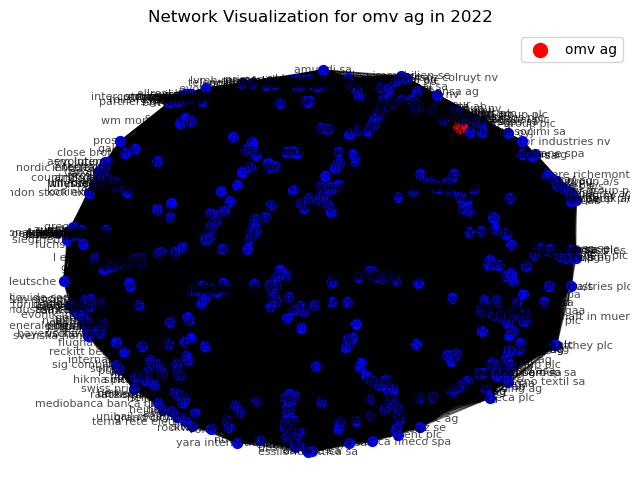

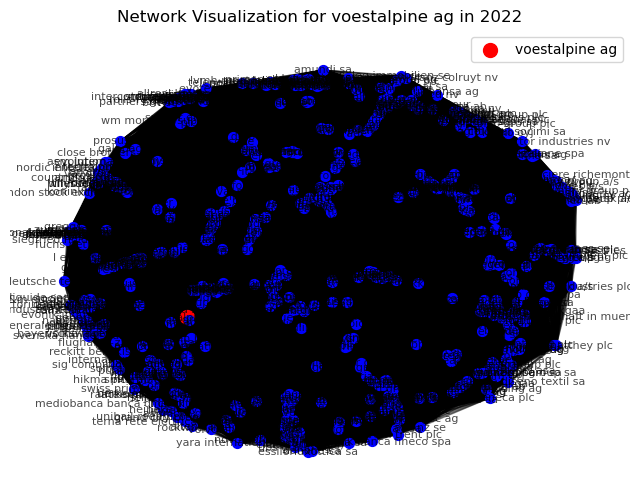

In [30]:
def create_subgraph_for_company(G, company_name):
    # Extract the neighbors of the company
    neighbors = list(G.neighbors(company_name))
    # Create a subgraph with the company and its neighbors
    subgraph = G.subgraph([company_name] + neighbors)
    return subgraph

def visualize_subgraph(G, central_node, title):
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(G, seed=42)  # Layout for the nodes

    # Draw the central node
    nx.draw_networkx_nodes(G, pos, nodelist=[central_node], node_color='red', node_size=100, label=central_node)
    # Draw the neighbor nodes
    nx.draw_networkx_nodes(G, pos, nodelist=set(G.nodes()) - {central_node}, node_color='blue', node_size=50)
    # Draw the edges
    nx.draw_networkx_edges(G, pos, alpha=0.5)
    # Labels
    nx.draw_networkx_labels(G, pos, font_size=8, alpha=0.7)

    plt.title(title)
    plt.legend()
    plt.axis("off")
    plt.show()

def key_player_subgraphs(key_players, graph, year):
    all_key_players = set()
    for centrality in ['Degree Centrality', 'Betweenness Centrality', 'Closeness Centrality', 'Eigenvector Centrality']:
        all_key_players.update([company for company, _ in key_players[centrality]])
        
    # Convert to list if needed
    all_key_players = list(all_key_players)
    
    for company in all_key_players:
        # Check if the company exists in the graph
        if company in graph:
            subgraph = create_subgraph_for_company(graph, company)
            visualize_subgraph(subgraph, company, f'Network Visualization for {company} in {year}')
        else:
            print(f"Company '{company}' not found in the {year} graph.")


key_player_subgraphs(key_players_2011, graph_2011, 2011)
key_player_subgraphs(key_players_2013, graph_2013, 2013)
key_player_subgraphs(key_players_2016, graph_2016, 2016)
key_player_subgraphs(key_players_2022, graph_2022, 2022)
